# Customer Lifetime Value

Customer lifetime value is the total worth a customer is to a business over the whole period of their business relationship. It’s an important metric as it costs less to keep existing customers than it does to acquire new ones, so increasing the value of an existing customers is a great way to drive growth.

Knowing the CLV score of a customer helps businesses develop strategies to acquire new customers and retain existing ones while maintaining profit margins.
This report calculates the lifetime value of clinics based on their HRO Orders in the last two years 

In [ ]:
!pip install Lifetimes
!pip install squarify
!pip install pystan==2.19.1.1
!pip install prophet

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import squarify
import matplotlib.pyplot as plt
import lifetimes
from lifetimes.utils import calibration_and_holdout_data, summary_data_from_transaction_data

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.max_rows', 500)

The data consists of the clinic's account numbers, the date the orders were placed and the total net value of the orders 

In [ ]:
#Import data for CLV
df = pd.read_csv('HRO_ORDERS.csv')
df.head(5)

,ACCOUNT_NUMBER,ORDER_PLACED_ON,TOTAL_NET_VALUE
0,856898,10/12/2021,354.560
1,856898,10/19/2021,579.240
2,856920,10/18/2021,363.880
3,856919,10/12/2021,589.000
4,857103,10/20/2021,795.540


We have no missing values in the record 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783533 entries, 0 to 783532
Data columns (total 3 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   ACCOUNT_NUMBER   783533 non-null  int64  
 1   ORDER_PLACED_ON  783533 non-null  object 
 2   TOTAL_NET_VALUE  783533 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 17.9+ MB


Statistical caluculations on the dataset

In [ ]:
df.describe()

,ACCOUNT_NUMBER,TOTAL_NET_VALUE
count,783533.000,783533.000
mean,730058.394,616.260
std,85793.669,689.537
min,601206.000,2.230
25%,628228.000,272.220
50%,753819.000,452.530
75%,807486.000,769.860
max,857160.000,69146.470


### Data Distribution for Clinics

The **Total Net Value** is largerly skewed to the right


There are outliers present  

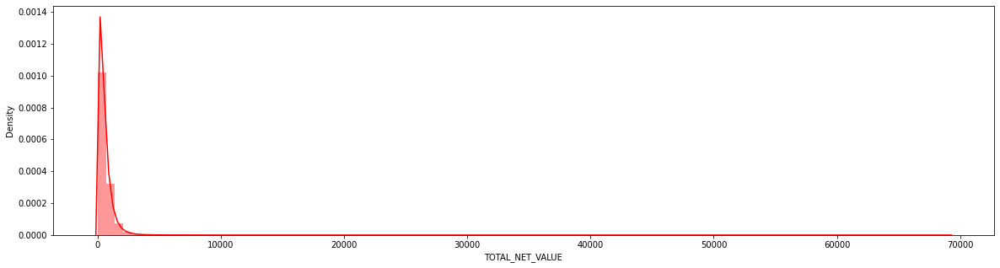

In [ ]:
plt.figure(figsize=(20,5))
sns.distplot(df['TOTAL_NET_VALUE'], color='r', bins=100)

## RFM Analysis for CLV 

Recency, Frequency and Monetary value (RFM) analysis tool is used to identify the best customers by measuring and analyzing their spending habits.

The following reports below shows the RFM analysis performed on our dataset. 

The best customer receives a top score in every category

### RFM Matrix



**Note the following terms below;**

**Frequency** is the number of repeat purchases the customer has made

**Recency** is the duration between a customer's first purchase and their last purchase 

**T value** is the duration between a customer's first purchase and the end of the period under study

**frequency_holdout** is the incremental value to be added to the frequency for the calibration period

**duration_holdout** is the number of days in the holdout period

**monetary_value** is the Average value of a customer's purchase


In [ ]:
#Extract information for CLV 
#Find Recency, frequency and value of purchases for a period of time


In [ ]:
#change the date format 
df['ORDER_PLACED_ON'] = pd.to_datetime(df['ORDER_PLACED_ON'])

The first order was placed on 2019-08-07 00:00:00 and the last order was placed on  2021-10-22 00:00:00

In [ ]:
df.ORDER_PLACED_ON.describe()

count                  783533
unique                    763
top       2021-06-28 00:00:00
freq                     2083
first     2019-08-07 00:00:00
last      2021-10-22 00:00:00
Name: ORDER_PLACED_ON, dtype: object

In [ ]:
#Using the new date format
display(df.sample(5))

,ACCOUNT_NUMBER,ORDER_PLACED_ON,TOTAL_NET_VALUE
415992,757123,2020-09-28,479.000
449579,753118,2021-03-17,494.400
523764,793610,2020-10-26,247.090
693013,837666,2021-06-30,444.990
673614,828694,2021-03-11,197.980


### Frequency histogram , frequency vs number of days

In [ ]:
min_date = '2019-08-07'
df_new = df.copy()

df_new['Min_date'] = min_date
df_new['Min_date'] = pd.to_datetime(df_new['Min_date'])
df_new['days_since_mindate'] = (df_new['ORDER_PLACED_ON'] - df_new['Min_date'])
df_new['days_since_mindate'] = df_new['days_since_mindate'].dt.days
df_new['days_since_mindate'] = df_new['days_since_mindate'].astype(int)
df_new = df_new.sort_values(by='days_since_mindate')
df_new.head()

,ACCOUNT_NUMBER,ORDER_PLACED_ON,TOTAL_NET_VALUE,Min_date,days_since_mindate
63051,610051,2019-08-07,232.990,2019-08-07,0
63033,610051,2019-08-14,448.170,2019-08-07,7
290064,716216,2019-08-15,1555.870,2019-08-07,8
73183,609203,2019-08-15,2192.160,2019-08-07,8
55376,607699,2019-08-19,360.760,2019-08-07,12


Text(0, 0.5, 'Frequency')

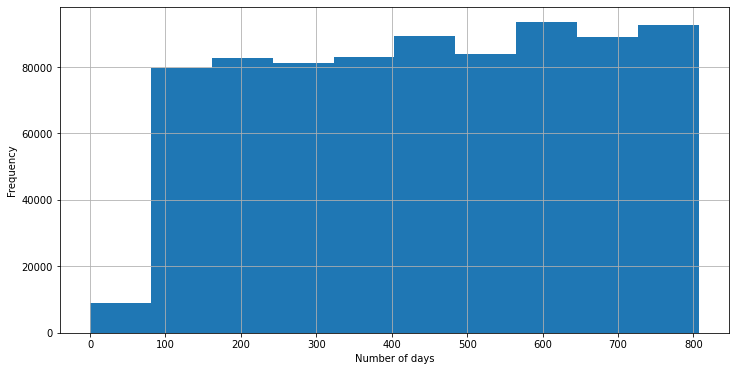

In [ ]:
# Frequency vs Number of days 
plt.figure(figsize=(12, 6))
df_new['days_since_mindate'].hist()
plt.xlabel('Number of days')
plt.ylabel('Frequency')

The step below, uses the Lifetimes python package to calucate the value of Frequency, Recency, T values and Monetary Value

In [ ]:
data = summary_data_from_transaction_data(df, 'ACCOUNT_NUMBER','ORDER_PLACED_ON', monetary_value_col='TOTAL_NET_VALUE', observation_period_end='2021-10-22' )
data.reset_index().head()

,ACCOUNT_NUMBER,frequency,recency,T,monetary_value
0,601206,104.000,729.000,732.000,819.012
1,601237,98.000,727.000,735.000,784.089
2,601244,85.000,728.000,731.000,405.967
3,601259,3.000,105.000,689.000,43.123
4,601665,57.000,706.000,730.000,625.114


In creating an RFM Matrix, defining the calibration period and holdout period helps us test how our model performs on data not yet seen by the model. 



In [ ]:
%%time

calibration_end_time = '2021-09-22'



cal_holdout_data = calibration_and_holdout_data(df, customer_id_col = 'ACCOUNT_NUMBER',
                                          datetime_col = 'ORDER_PLACED_ON',
                                          freq = 'D',
                                          monetary_value_col='TOTAL_NET_VALUE',
                                          calibration_period_end=calibration_end_time,
                                          observation_period_end='2021-10-22')

CPU times: user 3.81 s, sys: 66.8 ms, total: 3.88 s
Wall time: 3.9 s


In [ ]:
cal_holdout_data.head()

,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout
ACCOUNT_NUMBER,,,,,,,
601206,100.000,701.000,702.000,819.626,4.000,803.655,30.000
601237,94.000,699.000,705.000,788.073,4.000,690.452,30.000
601244,81.000,700.000,701.000,404.122,4.000,443.345,30.000
601259,3.000,105.000,659.000,43.123,0.000,0.000,30.000
601665,56.000,587.000,700.000,618.868,1.000,974.920,30.000


**One-time Buyers** 

In [ ]:
one_time_buyers = round(sum(data['frequency']==0)/float(len(data))*(100),2)
print("Percentage of clinics that place orders once: {}% ".format(one_time_buyers))

Percentage of clinics that place orders once: 8.71% 


**Returning Customers**

In [ ]:
returning_clinic = data[data['frequency'] >0]
print("Returning customers are: {}".format(len(returning_clinic)))

Returning customers are: 14243


### Frequency/Recency analysis using the lifetime model fitters.

In [ ]:
# Define a function for building a model
def building_model(cal_hold_data, model=None):
    model.fit(cal_holdout_data['frequency_cal'], cal_holdout_data['recency_cal'],cal_holdout_data['T_cal'])
    
    return model

#### Exploring the BetaGeoFitter Model

In [ ]:
#Exploring Lifetimes models 
 
from lifetimes import BetaGeoFitter, ModifiedBetaGeoFitter, GammaGammaFitter, ParetoNBDFitter
from lifetimes.plotting import plot_frequency_recency_matrix, plot_probability_alive_matrix, plot_calibration_purchases_vs_holdout_purchases, plot_history_alive,plot_period_transactions

In [ ]:
bgf_model = BetaGeoFitter(penalizer_coef=0.0)
bgf_model = building_model(cal_holdout_data, model = bgf_model)

In [ ]:
bgf_model.summary

,coef,se(coef),lower 95% bound,upper 95% bound
r,1.115,0.014,1.088,1.142
alpha,13.771,0.200,13.379,14.163
a,0.153,0.015,0.123,0.184
b,39.189,6.065,27.302,51.075


The report below compares the performance of the BetaGeoFitter model with the ground truth

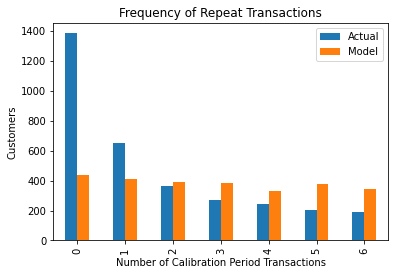

In [ ]:
plot_period_transactions(bgf_model)

The report below shows the Frequency/Recency analysis using the BG model 

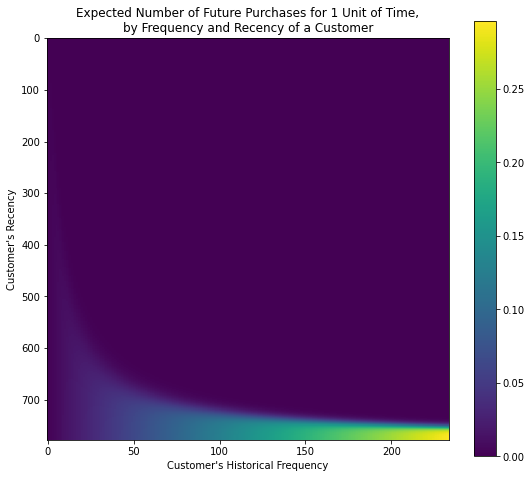

In [ ]:
#Visualizing our Frequency/recency Matrix
plt.figure(figsize=(9,8))
plot_frequency_recency_matrix(bgf_model)

#### Reports and Findings (frequency/recency) in 700 days
We can see that if a customer has bought 200 times from you, and their latest purchase was when they were 700 days old, then they are your best customer (bottom-right). Your coldest customers are those that are in the top-right corner: they bought a lot quickly, and we haven’t seen them in days. 

In [ ]:
# Define a function for getting predictions  
def get_predictions(model):
    #predicted frequency during holdout period
    pred_freq_holdout = model.predict(cal_holdout_data['duration_holdout'], cal_holdout_data['frequency_cal'], cal_holdout_data['recency_cal'], cal_holdout_data['T_cal'])

    #actual frquency during holdout period
    freq_holdout =  cal_holdout_data['frequency_holdout']

    #score the model performance using Root Mean Squared Error
    rmse = np.sqrt(np.sum(np.square(freq_holdout - pred_freq_holdout ))/pred_freq_holdout.shape[0])

    #score the model performance using Mean Squared Error
    mse = np.sum(np.square(freq_holdout - pred_freq_holdout ))/pred_freq_holdout.shape[0]

    #score the model performance using Mean Absolute error
    mae = np.sum(np.abs(freq_holdout - pred_freq_holdout ))/pred_freq_holdout.shape[0]

    print("Performance Score: RMSE {}, MSE {}, MAE {}".format(rmse, mse, mae)  )


Scoring our model performance using using Root Mean Squared Error (RMSE), Mean Squared Error(MSE) and Mean Absolute error (MAE)

In [ ]:
# Use BetaGeoFitter Model to make predictions on hold out data
get_predictions(bgf_model)

Performance Score: RMSE 0.9741758819360788, MSE 0.9490186489459371, MAE 0.6312296226406288


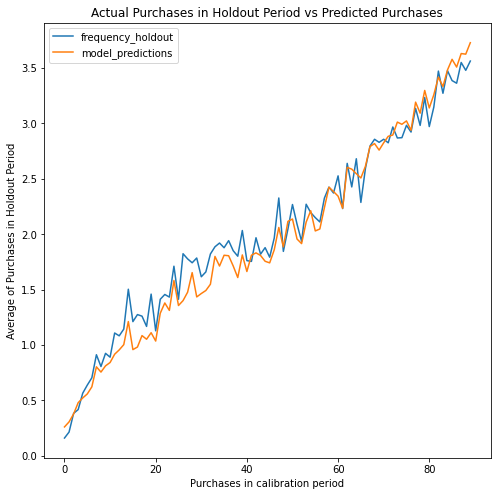

In [ ]:
# Plot calibration purchases vs holdout purchases
plot_calibration_purchases_vs_holdout_purchases(bgf_model,cal_holdout_data, n=90, **{'figsize':(8,8)} )
display()

## Exploring the ModifiedBetaGeoFitter (MBGF)

In [ ]:
%%time
mbgf_model = ModifiedBetaGeoFitter(penalizer_coef=0.001)
mbgf_model = building_model(cal_holdout_data, model = mbgf_model)

CPU times: user 556 ms, sys: 6.94 ms, total: 563 ms
Wall time: 560 ms


In [ ]:
mbgf_model.summary

,coef,se(coef),lower 95% bound,upper 95% bound
r,2.063,0.028,2.007,2.118
alpha,23.391,0.343,22.719,24.064
a,0.041,0.001,0.039,0.043
b,0.541,0.026,0.491,0.591


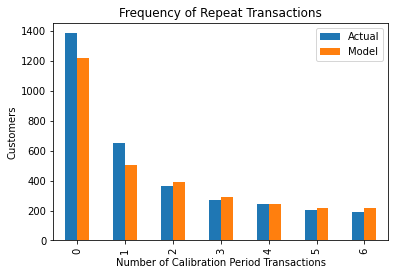

In [ ]:
plot_period_transactions(mbgf_model)

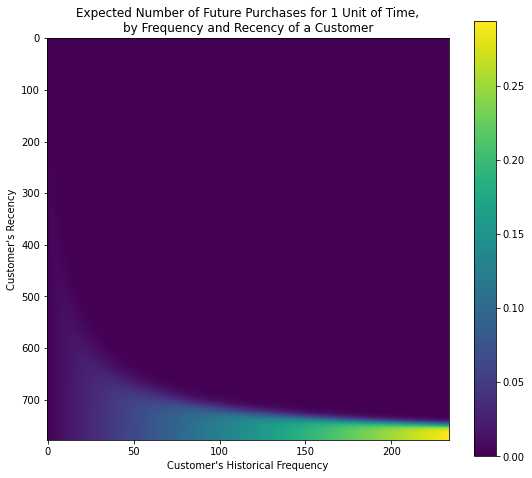

In [ ]:
#Visualizing our Frequency/recency Matrix
plt.figure(figsize=(9,8))
plot_frequency_recency_matrix(mbgf_model)

In [ ]:
# Use Modified BetaGeoBetaBinomFitter Model to make predictions on hold out data
get_predictions(mbgf_model)

Performance Score: RMSE 0.9800810534342076, MSE 0.960558871300706, MAE 0.6290932169654295


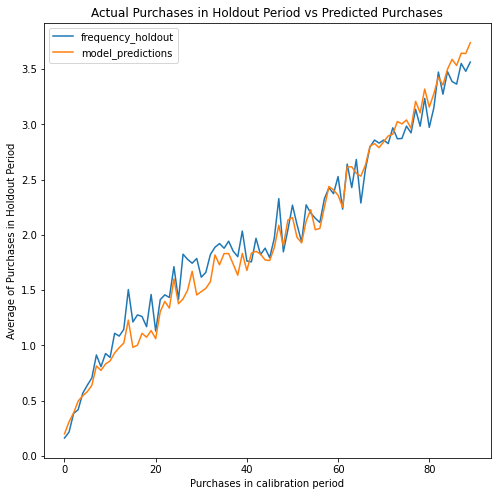

In [ ]:
# Plot calibration purchases vs holdout purchases
plot_calibration_purchases_vs_holdout_purchases(mbgf_model,cal_holdout_data, n=90, **{'figsize':(8,8)} )
display()

We can see that our actual data (frequency hold out) and our model predictions data line up well.

## Exploring the ParetoNBFFitter model

In [ ]:
%%time
pareto_model = ParetoNBDFitter(penalizer_coef=0.005)
pareto_model = building_model(cal_holdout_data, model = pareto_model)

CPU times: user 7.15 s, sys: 10.2 ms, total: 7.16 s
Wall time: 7.15 s


In [ ]:
pareto_model.params_

r        2.557
alpha   29.967
s        0.039
beta     3.054
dtype: float64

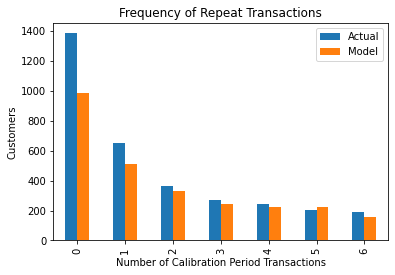

In [ ]:
plot_period_transactions(pareto_model)

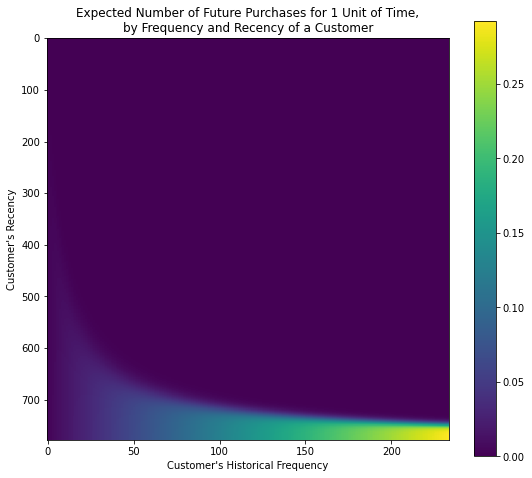

In [ ]:
#Visualizing our Frequency/recency Matrix
plt.figure(figsize=(9,8))
plot_frequency_recency_matrix(pareto_model)

### Model Predictions

In [ ]:
# Use Pareto Model to make predictions on hold out data
get_predictions(pareto_model)

Performance Score: RMSE 0.9805193533847094, MSE 0.9614182023619687, MAE 0.6317460503397935


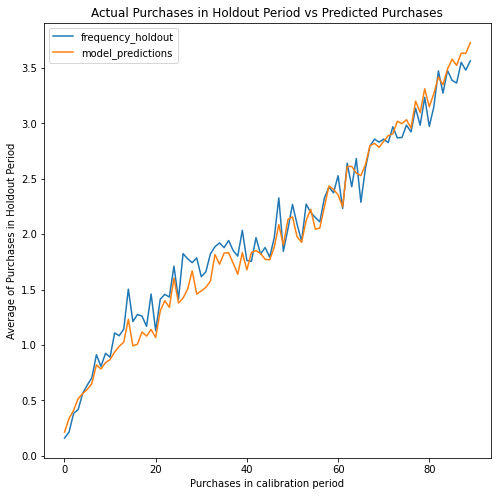

In [ ]:
plot_calibration_purchases_vs_holdout_purchases(pareto_model,cal_holdout_data, n=90, **{'figsize':(8,8)} )
display()

We can see that our actual data (frequency hold out) and our model predictions data line up well.   
ParetoNBDFitter model performs better than **BGF**. **MBGF** model is better among all models.

## Calculate the probability a clinic is currently "alive"

The prediction of a customer being "alive" shows us the probability that an existing customer will likely still engage in business.
Probability ranges from 0-1. We will consider **MBGF model** to calculate the probability of a clinic being alive as it performs than other models.

The higher the probability, the more "alive" the customer is to the business. 

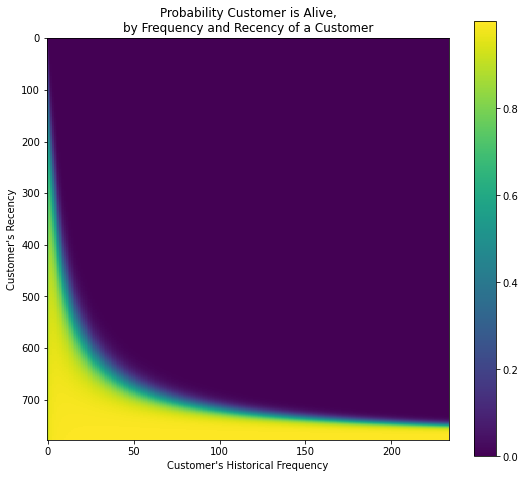

In [ ]:
plt.figure(figsize=(9,8))
plot_probability_alive_matrix(mbgf_model)

In [ ]:
cal_holdout_data['prob_alive']= mbgf_model.conditional_probability_alive(cal_holdout_data['frequency_cal'], cal_holdout_data['recency_cal'], cal_holdout_data['T_cal'])
cal_holdout_data.head(3)

,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,prob_alive
ACCOUNT_NUMBER,,,,,,,,
601206,100.000,701.000,702.000,819.626,4.000,803.655,30.000,1.000
601237,94.000,699.000,705.000,788.073,4.000,690.452,30.000,0.999
601244,81.000,700.000,701.000,404.122,4.000,443.345,30.000,0.999


### Inspect the activity of a single clinic (601665)

In [ ]:
#Picked any clinic at random 
days_since_birth = 600

#get the clinic's transaction history 
clinic_df = df.loc[df['ACCOUNT_NUMBER']==601665]
clinic_df.head()

,ACCOUNT_NUMBER,ORDER_PLACED_ON,TOTAL_NET_VALUE
46872,601665,2020-09-29,365.960
46873,601665,2020-11-02,628.380
46874,601665,2020-12-01,1001.220
46875,601665,2021-01-26,281.720
46876,601665,2019-11-20,1276.680


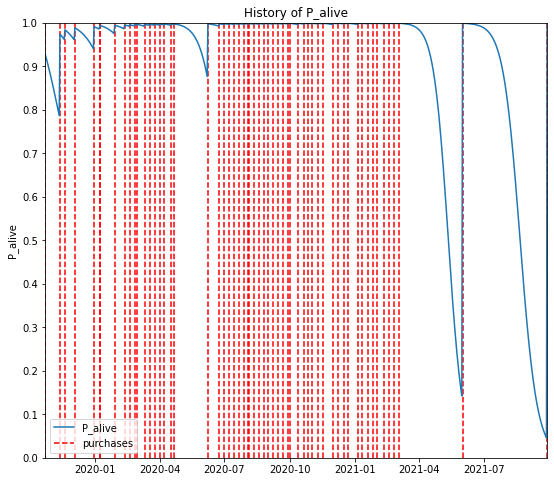

In [ ]:
plt.figure(figsize=(9,8))
plot_history_alive(mbgf_model,days_since_birth, clinic_df, 'ORDER_PLACED_ON')
display()

### Report and findings on clinic (601665) in 6months
1. From the chart, this clinic (account number- 601665) made it's first order in 2019 followed by repeat orders. 
2. The probability of this clinic being alive declined between April to June 2021
3. The probability that this clinic is alive has dropped below 0.1 indicating that this clinic no longer engages.

## Predicting the number of orders to expect from a clinic over a future time interval using MBGF model

In [ ]:
months_3 = 92
months_6 = 184
cal_holdout_data['orders_3Months']=np.ceil((mbgf_model.conditional_expected_number_of_purchases_up_to_time(months_3,
                                                                              cal_holdout_data['frequency_cal'], 
                                                                                cal_holdout_data['recency_cal'], 
                                                                               cal_holdout_data['T_cal']  ))).astype(int)
cal_holdout_data['orders_6Months']=np.ceil((mbgf_model.conditional_expected_number_of_purchases_up_to_time(months_6,
                                                                              cal_holdout_data['frequency_cal'], 
                                                                                cal_holdout_data['recency_cal'], 
                                                                               cal_holdout_data['T_cal']  ))).astype(int)


cal_holdout_data.head(3).reset_index()

,ACCOUNT_NUMBER,frequency_cal,recency_cal,T_cal,monetary_value_cal,frequency_holdout,monetary_value_holdout,duration_holdout,prob_alive,orders_3Months,orders_6Months
0,601206,100.000,701.000,702.000,819.626,4.000,803.655,30.000,1.000,13,26
1,601237,94.000,699.000,705.000,788.073,4.000,690.452,30.000,0.999,13,25
2,601244,81.000,700.000,701.000,404.122,4.000,443.345,30.000,0.999,11,21


## Detailed Reports and Findings 

**Customer Lifetime Value**

In [ ]:
data = data[(data['monetary_value']>0)] #remove negative values 
gamma_model = GammaGammaFitter(penalizer_coef = 0)
gamma_model.fit(data['frequency'],data['monetary_value'] )

<lifetimes.GammaGammaFitter: fitted with 14243 subjects, p: 0.40, q: 3.70, v: 3813.05>

In [ ]:
#Average transaction value
avt =gamma_model.conditional_expected_average_profit(data['frequency'],data['monetary_value'])
avt.head(5)

ACCOUNT_NUMBER
601206   803.310
601237   769.747
601244   417.525
601259   403.128
601665   618.451
dtype: float64

In [ ]:
data['Average_transaction_Value'] = avt

In [ ]:
print("Expected conditional average profit: {}, Average profit: {}".format(
    gamma_model.conditional_expected_average_profit(
       data['frequency'],
        data['monetary_value']
    ).mean(),
    data[data['frequency']>0]['monetary_value'].mean()
))


Expected conditional average profit: 560.3567382902438, Average profit: 525.1738615320435


## Report Table

1. Account Number (Clinic's ID)

2. Frequency is the number of repeat purchases the customer has made

3. Recency is the duration between a customer's first purchase and their last purchase

4. T Value is the duration between a customer's first purchase and the end of the period under study

5. Monetary Value is the Average value of a customer's purchase

6. Average transaction value is the expected average profit

7. CLV Score (normalized from 1-10) is the customer lifetime value score

8. CLV in 3months is the customer lifetime value in 3 months 

9. CLV in 6months is the customer lifetime value in 6 months

10. Predicted number of orders in 3months

11. Predicted number of orders in 6 months

12. Predicted Net value in 3 months

13. Predicted Net value in 6 months 

14. Probability that customer is alive



In [ ]:
#CLV Score for all clinics 
#standardize  CLV score to a range of 1-10
#using this formula z_normalized = (z- min(z))/(max(z)-min(z))
#time in months
months_3 = 92
months_6 = 184
data['CLV_Score']= round(gamma_model.customer_lifetime_value(mbgf_model, data['frequency'],data['recency'], data['T'], data['monetary_value'], time=365 ), 2)
data['CLV_Score']= np.ceil((data['CLV_Score']-min(data['CLV_Score']))/(max(data['CLV_Score'])-min(data['CLV_Score']))*10).astype(int)



data['CLV_3months']= round(gamma_model.customer_lifetime_value(mbgf_model, data['frequency'],data['recency'], data['T'], data['monetary_value'], time=months_3 ), 2)


data['CLV_6months']= round(gamma_model.customer_lifetime_value(mbgf_model, data['frequency'],data['recency'], data['T'], data['monetary_value'], time=months_6), 2)


data['orders_3Months']=np.ceil((mbgf_model.conditional_expected_number_of_purchases_up_to_time(months_3,
                                                                             data['frequency'], 
                                                                                data['recency'], 
                                                                               data['T']  ))).astype(int)
data['orders_6Months']=np.ceil((mbgf_model.conditional_expected_number_of_purchases_up_to_time(months_6,
                                                                              data['frequency'], 
                                                                                data['recency'], 
                                                                               data['T']  ))).astype(int)


data['Net_3Months']= round(data['orders_3Months'] * data['Average_transaction_Value'],2)
data['Net_6Months']= round(data['orders_6Months'] * data['Average_transaction_Value'],2)

data['prob_alive']= mbgf_model.conditional_probability_alive(data['frequency'], data['recency'], data['T'])

data[['frequency','recency', 'T']] = data[['frequency','recency', 'T']].astype(int)

data.sort_values(by='CLV_Score', ascending=False).head(20).reset_index()

,ACCOUNT_NUMBER,frequency,recency,T,monetary_value,Average_transaction_Value,CLV_Score,CLV_3months,CLV_6months,orders_3Months,orders_6Months,Net_3Months,Net_6Months,prob_alive
0,711967,178,724,732,14302.281,13798.165,10,5705744.210,7901166.040,22,44,303559.630,607119.250,0.998
1,837715,127,725,731,17209.125,16365.517,9,4859774.540,6729581.360,16,32,261848.270,523696.530,0.999
2,687000,123,738,742,10211.509,9707.449,5,2754721.180,3814793.190,15,30,145611.740,291223.480,0.999
3,821439,90,664,665,9138.612,8537.835,4,1978438.910,2738737.140,13,25,110991.860,213445.880,0.999
4,643143,182,734,736,3866.216,3747.569,3,1577825.240,2184973.040,23,45,86194.080,168640.580,1.000
5,612340,99,729,732,2595.272,2464.984,2,572560.390,792848.820,13,25,32044.790,61624.600,0.999
6,618355,87,699,704,2953.815,2780.935,2,590501.910,817580.270,12,23,33371.220,63961.510,0.999
7,854247,24,158,165,3194.367,2614.651,2,601775.740,830004.920,13,25,33990.460,65366.280,0.996
8,629677,65,524,526,3079.943,2842.164,2,597721.200,826787.360,12,23,34105.970,65369.770,0.999
9,615892,197,734,736,1565.598,1532.223,2,697697.820,966174.290,25,48,38305.590,73546.730,1.000


## Cohort analysis/segmentation based recency (in days).

Text(0, 0.5, 'Count')

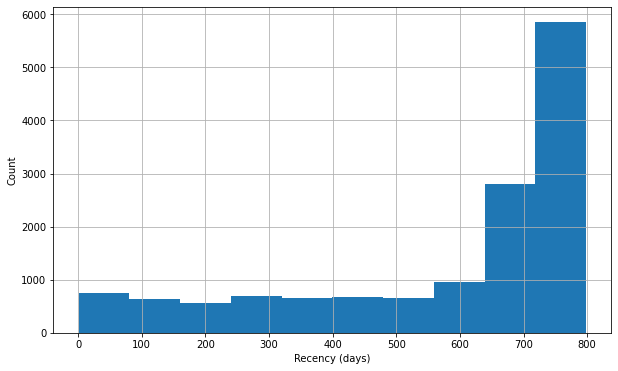

In [ ]:
# Histogram for recency
plt.figure(figsize=(10,6))
data['recency'].hist()
plt.xlabel('Recency (days)')
plt.ylabel('Count')

We can see that the maximum recency is reached near 800. So, we create 4 custom cohorts/segments based recency as follows:    
1. 0 - 200 = Cohort 4   
2. 200 - 400 = Cohort 3
3. 400 - 600 = Cohort 2   
4. 600 - 800 = Cohort 1  

In [ ]:
# Define a function to Cohorts based on recency
def create_cohorts(df):
    if (df['recency'] >= 0) and (df['recency']<200):
        return 'Cohort 4'
    elif ((df['recency'] >= 200) and (df['recency']<400)):
        return 'Cohort 3'
    elif ((df['recency'] >= 400) and (df['recency']<600)):
        return 'Cohort 2'
    else:
        return 'Cohort 1'

# Create a new variable Cohort level
data['Cohort_Level'] = data.apply(create_cohorts, axis=1)

# Print the header with the top 5 rows to the console.
data.head()

,frequency,recency,T,monetary_value,Average_transaction_Value,CLV_Score,CLV_3months,CLV_6months,orders_3Months,orders_6Months,Net_3Months,Net_6Months,prob_alive,Cohort_Level
ACCOUNT_NUMBER,,,,,,,,,,,,,,
601206,104,729,732,819.012,803.310,1,195828.640,271172.930,13,26,10443.030,20886.050,0.999,Cohort 1
601237,98,727,735,784.089,769.747,1,176236.880,244045.990,13,25,10006.710,19243.670,0.999,Cohort 1
601244,85,728,731,405.967,417.525,1,83645.870,115826.520,11,22,4592.780,9185.550,0.999,Cohort 1
601259,3,105,689,43.123,403.128,1,71.870,99.400,1,1,403.130,403.130,0.015,Cohort 4
601665,57,706,730,625.114,618.451,1,83799.770,116035.790,8,15,4947.610,9276.770,0.995,Cohort 1


### Analyzing custom segments

In [ ]:
# Calculate average values for each Cohort_Level, and return a size of each segment 
cohort_level_agg = data.groupby('Cohort_Level').agg(
    RecencyMean = ('recency', 'mean'),
    FrequencyMean = ('frequency', 'mean'),
    MonetaryMean = ('monetary_value', 'mean'),
    CLV_ScoreMean = ('CLV_Score', 'mean'),
    CLV_3monthsMean = ('CLV_3months', 'mean'),
    CLV_6monthsMean = ('CLV_6months', 'mean'),
    GroupSize = ('recency', 'size'))


# Print the aggregated dataset
cohort_level_agg

,RecencyMean,FrequencyMean,MonetaryMean,CLV_ScoreMean,CLV_3monthsMean,CLV_6monthsMean,GroupSize
Cohort_Level,,,,,,,
Cohort 1,711.850,72.466,563.302,1.006,105051.989,145464.391,9125
Cohort 2,505.543,33.749,485.155,0.924,39465.390,54585.076,1812
Cohort 3,299.841,21.104,457.698,0.837,38777.757,53553.338,1683
Cohort 4,91.452,6.165,425.458,0.903,29852.659,41138.920,1623


In [ ]:
# highlight the maximum in a column
def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
cohort_level_agg.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=0)

,RecencyMean,FrequencyMean,MonetaryMean,CLV_ScoreMean,CLV_3monthsMean,CLV_6monthsMean,GroupSize
Cohort_Level,,,,,,,
Cohort 1,711.849534,72.466192,563.301583,1.005918,105051.989236,145464.390838,9125
Cohort 2,505.543046,33.749448,485.155120,0.924393,39465.389752,54585.076054,1812
Cohort 3,299.841355,21.103981,457.697579,0.836601,38777.757201,53553.338229,1683
Cohort 4,91.451633,6.164510,425.457958,0.902649,29852.659217,41138.919519,1623


We can see that the **Cohort 1** contains the **best customers** having highest **RecencyMean, FrequencyMean, MonetaryMean, CLV_ScoreMean, CLV_3monthsMean, CLV_6monthsMean**, & **GroupSize**.     
Here **GroupSize** is the **number of customers in each cohort/segment**. 

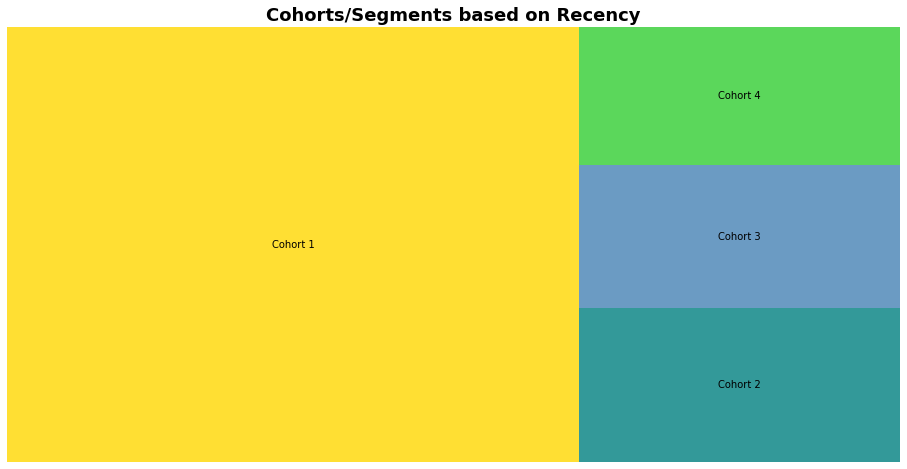

In [ ]:
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(16, 8)
squarify.plot(sizes = cohort_level_agg['GroupSize'], 
              label = cohort_level_agg.index,
              color = ['gold', 'teal', 'steelblue', 'limegreen'],
              alpha = 0.8)
plt.title("Cohorts/Segments based on Recency",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

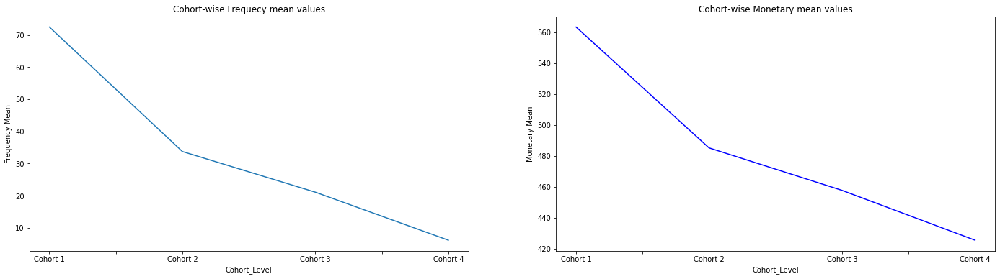

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,6)) # for 2 parrallel plots

cohort_level_agg.FrequencyMean.plot(ax=ax1)
ax1.set_title('Cohort-wise Frequecy mean values')
ax1.set_ylabel('Frequency Mean')

cohort_level_agg.MonetaryMean.plot(ax=ax2, c='b')
ax2.set_title('Cohort-wise Monetary mean values');
ax2.set_ylabel('Monetary Mean');

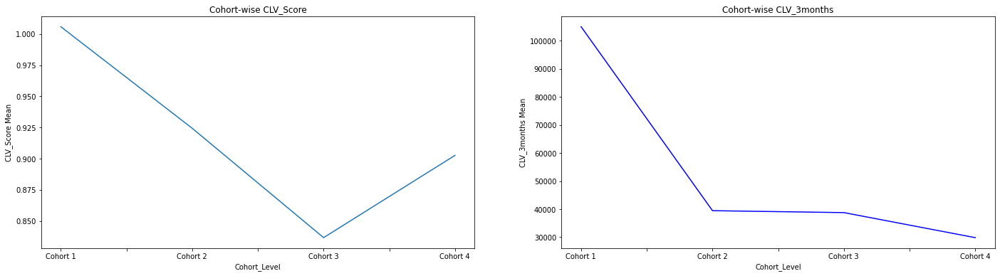

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,6)) # for 2 parrallel plots

cohort_level_agg.CLV_ScoreMean.plot(ax=ax1)
ax1.set_title('Cohort-wise CLV_Score')
ax1.set_ylabel('CLV_Score Mean')

cohort_level_agg.CLV_3monthsMean.plot(ax=ax2, c='b')
ax2.set_title('Cohort-wise CLV_3months')
ax2.set_ylabel('CLV_3months Mean');

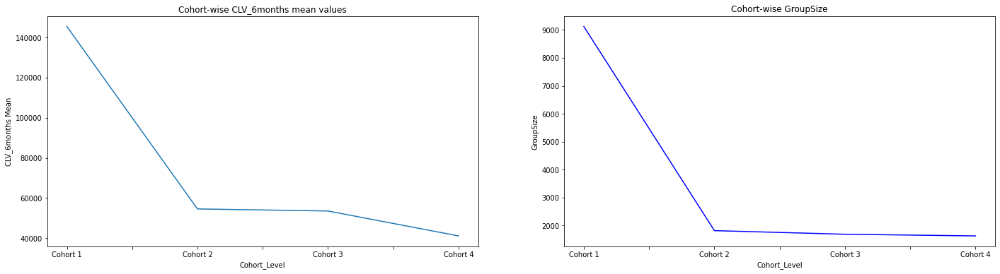

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,6)) # for 2 parrallel plots

cohort_level_agg.CLV_6monthsMean.plot(ax=ax1)
ax1.set_title('Cohort-wise CLV_6months mean values')
ax1.set_ylabel('CLV_6months Mean')

cohort_level_agg.GroupSize.plot(ax=ax2, c='b')
ax2.set_title('Cohort-wise GroupSize')
ax2.set_ylabel('GroupSize');

### Develop a Scatterplot for the Clincs based on their CLV Scores

Text(0, 0.5, 'CLV Score')

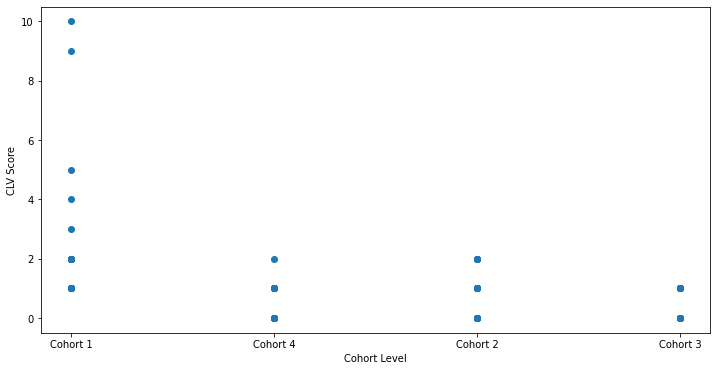

In [ ]:
data = data.reset_index(drop=False)
data1 = data.copy()
plt.figure(figsize=(12,6))
plt.scatter(data1['Cohort_Level'], data1['CLV_Score'])
plt.xlabel('Cohort Level')
plt.ylabel('CLV Score')

## **Time series model to forecast the Total Net value of all clinics**

In [ ]:
# Select required columns
df_tot = df[['ORDER_PLACED_ON', 'TOTAL_NET_VALUE']].copy()

In [ ]:
df_tot.head()

,ORDER_PLACED_ON,TOTAL_NET_VALUE
0,2021-10-12,354.560
1,2021-10-19,579.240
2,2021-10-18,363.880
3,2021-10-12,589.000
4,2021-10-20,795.540


In [ ]:
df_tot['ORDER_PLACED_ON'].describe()

count                  783533
unique                    763
top       2021-06-28 00:00:00
freq                     2083
first     2019-08-07 00:00:00
last      2021-10-22 00:00:00
Name: ORDER_PLACED_ON, dtype: object

### Normalize the data

Now, let's create train & test data. We will consider the **last 3 months data** as test data for evaluating model performance.

In [ ]:
train_data = df_tot[df_tot['ORDER_PLACED_ON']<'2021-04-01']
test_data = df_tot[df_tot['ORDER_PLACED_ON']>='2021-04-01']

In [ ]:
train_data.shape, test_data.shape

((553485, 2), (230048, 2))

In [ ]:
# Set ORDER_PLACED_ON  as index 
train = train_data.set_index('ORDER_PLACED_ON')
test = test_data.set_index('ORDER_PLACED_ON')
# Resample the data daily
train = train.resample('W').sum()
test = test.resample('W').sum()
# Specify datetime frequency
train = train.asfreq('W')
test = test.asfreq('W')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() 
values = train['TOTAL_NET_VALUE'].values
# Reshape the data 
values = values.reshape((len(values), 1))
# Fit the scaler 
scaler.fit(values)

train['TOTAL_NET_VALUE'] = scaler.transform(values).flatten()
test_values = test['TOTAL_NET_VALUE'].values
# Reshape the data 
test_values = test_values.reshape((len(test_values), 1))
test['TOTAL_NET_VALUE'] = scaler.transform(test_values).flatten()

In [ ]:
train.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2019-08-11,0.000
2019-08-18,0.000
2019-08-25,0.000
2019-09-01,0.000
2019-09-08,0.000


In [ ]:
test.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2021-04-04,0.198
2021-04-11,0.551
2021-04-18,0.570
2021-04-25,0.560
2021-05-02,0.560


**Visualizing the time series in train**

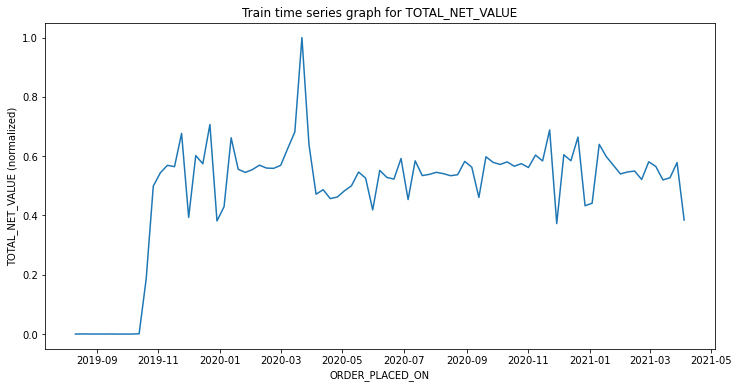

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Train time series graph for TOTAL_NET_VALUE")
plt.plot(train);

**Visualizing the time series in test**

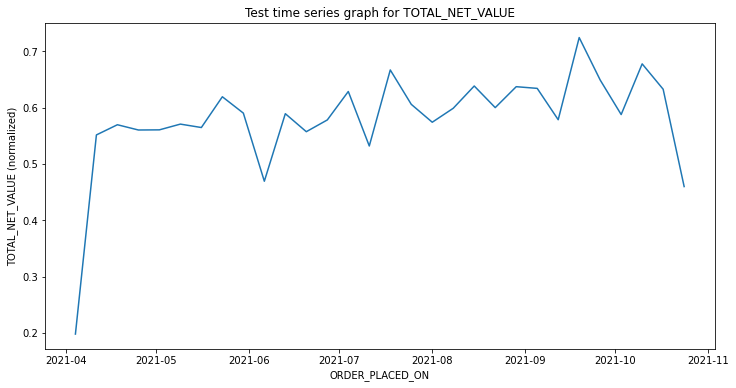

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Test time series graph for TOTAL_NET_VALUE")
plt.plot(test);

We use [Prophet](https://facebook.github.io/prophet/docs/quick_start.html#python-api) library for time series forecasting.The Prophet library is an open-source library designed for making forecasts for univariate time series datasets. It is easy to use and designed to automatically find a good set of hyperparameters for the model in an effort to make skillful forecasts for data with trends and seasonal structure by default.

In [ ]:
from prophet import Prophet

The fit() function takes a DataFrame of time series data. The DataFrame must have a specific format. The first column must have the name ‘ds‘ and contain the date-times. The second column must have the name ‘y‘ and contain the observations.

In [ ]:
train_df = train.copy().reset_index(drop=False)
test_df = test.copy().reset_index(drop=False)

# prepare expected column names
train_df.columns = ['ds', 'y']
test_df.columns = ['ds', 'y']

In [ ]:
train_df.head()

,ds,y
0,2019-08-11,0.000
1,2019-08-18,0.000
2,2019-08-25,0.000
3,2019-09-01,0.000
4,2019-09-08,0.000


In [ ]:
test_df.head()

,ds,y
0,2021-04-04,0.198
1,2021-04-11,0.551
2,2021-04-18,0.570
3,2021-04-25,0.560
4,2021-05-02,0.560


Now, train the **Prophet** model

In [ ]:
# define the model
model = Prophet()               #changepoint_range=0.5, n_changepoints=50
# fit the model
model.fit(train_df)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, let's make a **forecast on test data**

In [ ]:
from sklearn.metrics import mean_absolute_error

MAE: 0.057


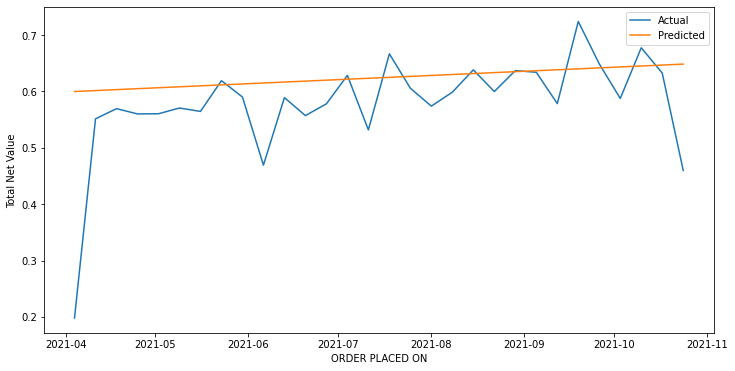

In [ ]:
# use the model to make a forecast on test data
forecast = model.predict(test_df)
# test_df_1 = test_df.resample('W', on='ds').sum().reset_index(drop=False)
# forecast_1 = forecast[['ds','yhat']].resample('W', on='ds').sum().reset_index(drop=False)
# test_df_1.columns = ['ds', 'y']
# forecast_1.columns = ['ds', 'y']
# calculate MAE between expected and predicted values for test data
y_true = test_df['y'].values
y_pred = forecast['yhat'].values
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
# plot expected vs actual
plt.figure(figsize=(12, 6))
plt.plot(test_df['ds'], y_true, label='Actual')
plt.plot(forecast['ds'], y_pred, label='Predicted')
plt.xlabel('ORDER PLACED ON')
plt.ylabel('Total Net Value')
plt.legend()
plt.show()

In [ ]:
forecasted_revenue = forecast['yhat'].astype(float).values
actual_revenue = test_df['y'].values
# Reshape arrays
forecasted_revenue = forecasted_revenue.reshape((len(forecasted_revenue),1))
actual_revenue = actual_revenue.reshape((len(actual_revenue),1))
test_df['forecasted revenue'] = scaler.inverse_transform(forecasted_revenue).flatten()
test_df['y'] = scaler.inverse_transform(actual_revenue).flatten()
test_df = test_df.rename(columns={'y':'Actual revenue'})
test_df.tail()

,ds,Actual revenue,forecasted revenue
25,2021-09-26,5256981.870,5199821.170
26,2021-10-03,4760561.240,5213404.261
27,2021-10-10,5488981.860,5226987.351
28,2021-10-17,5124318.680,5240570.442
29,2021-10-24,3725113.650,5254153.533


Model performance on test data is good. We can see model is not predicting well at peaks. It seems those peaks represent the holidays, hence the model is not capturing well.

Now, forecast the total net value for next 30days, 60 days,.... upto a year. Let's define some helper functions.

In [ ]:
# Define a function
def plot_forecasts(df, n_days):      # n_days - Number of days for which we want a prediction
    # Set ORDER_PLACED_ON  as index 
    df = df.set_index('ORDER_PLACED_ON')
    # Resample the data daily
    df = df.resample('D').sum()
    # Specify datetime frequency
    df = df.asfreq('D')
    # Reset index
    df = df.reset_index(drop=False)
    # prepare expected column names
    df.columns = ['ds', 'y']

    # define the model
    model_p = Prophet()
    # fit the model
    model_p.fit(df)
    
    # Create future dates as per n_days for which we want prediction
    future = model_p.make_future_dataframe(periods=n_days, include_history=False)
    # use the model to make a forecast on test data
    forecast = model_p.predict(future)
    # forecast= forecast[['ds','yhat','yhat_lower','yhat_upper']]
    # forecast.columns = ['ds', 'yhat','yhat_lower','yhat_upper']
    # df_1 = df.resample('W', on='ds').sum().reset_index(drop=False)
    # df_1.columns = ['ds', 'y']
    # plot expected vs actual
    plt.figure(figsize=(12, 6))
    plt.plot(df['ds'], df['y'], label='Observed', color='b')
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='r')
    plt.plot(forecast['ds'], forecast['yhat_lower'], label='Lower Confidence Bound', color='g')
    plt.plot(forecast['ds'], forecast['yhat_upper'], label='Upper Confidence Bound', color='orange')
    plt.xlabel('ORDER PLACED ON')
    plt.ylabel('Total Net Value')
    plt.title('Time series chart includes Observed, & forecasted values')
    plt.legend()
    plt.show()
    plt.close()
    
    # Plot only forecasted values
    plt.figure(figsize=(12, 6))
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', color='r')
    plt.plot(forecast['ds'], forecast['yhat_lower'], label='Lower Confidence Bound', color='g')
    plt.plot(forecast['ds'], forecast['yhat_upper'], label='Upper Confidence Bound', color='orange')
    plt.xlabel('ORDER PLACED ON')
    plt.ylabel('Total Net Value')
    plt.title('Time series chart includes only forecasted values')
    plt.legend()
    plt.show()
    plt.close()

    return forecast

### Forecast the Total net value of all clinics for next 30 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


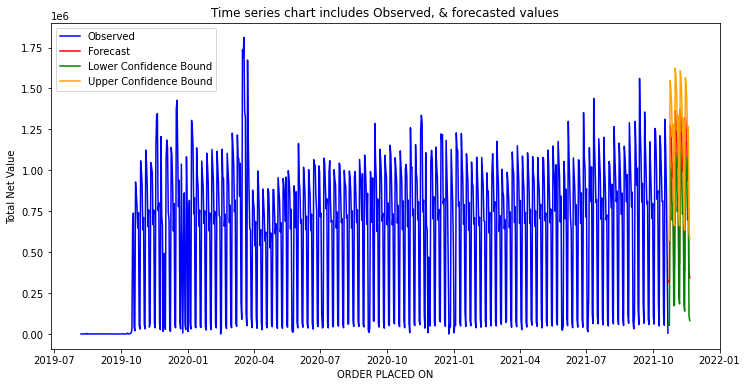

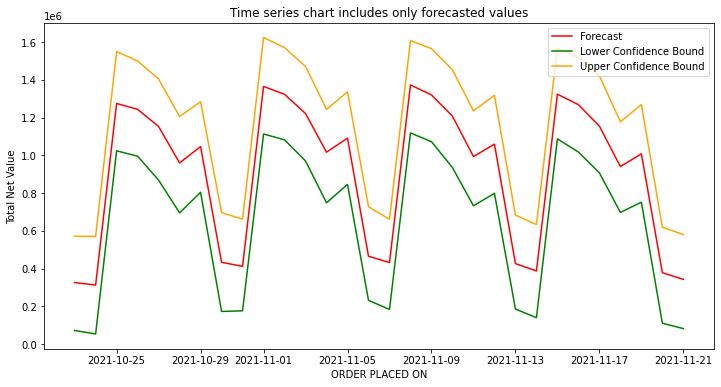

In [ ]:
forecast_next30days= plot_forecasts(df_tot, n_days=30)

In [ ]:
forecast_next30days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,71880.102,570810.070
1,2021-10-24,312354.041,53247.625,570373.648
2,2021-10-25,1274762.992,1023784.102,1549498.665
3,2021-10-26,1243587.644,995449.024,1500104.175
4,2021-10-27,1152633.461,868530.073,1404423.272
5,2021-10-28,959857.316,695036.216,1205392.503
6,2021-10-29,1046368.210,804178.201,1283928.183
7,2021-10-30,433030.551,172636.040,696435.409
8,2021-10-31,411662.642,175971.658,661895.319
9,2021-11-01,1364843.483,1112995.732,1624507.095


### Forecast the Total net value of all clinics for next 60 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


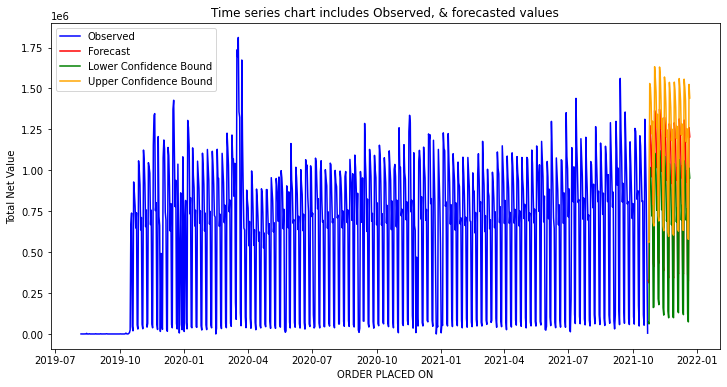

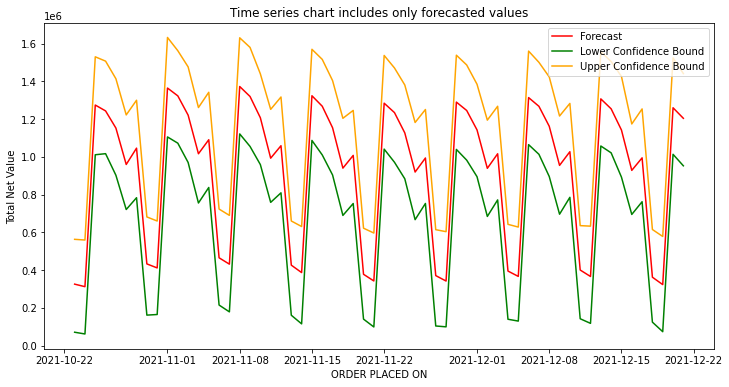

In [ ]:
forecast_next60days = plot_forecasts(df_tot, n_days=60)

In [ ]:
forecast_next60days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,70958.829,563199.893
1,2021-10-24,312354.041,61691.966,559526.141
2,2021-10-25,1274762.992,1011404.983,1530352.444
3,2021-10-26,1243587.644,1017042.235,1507321.610
4,2021-10-27,1152633.461,902703.015,1414046.445
5,2021-10-28,959857.316,721154.724,1222485.269
6,2021-10-29,1046368.210,783679.544,1300241.129
7,2021-10-30,433030.551,161603.382,681915.363
8,2021-10-31,411662.642,164836.764,660210.648
9,2021-11-01,1364843.483,1105761.459,1632840.108


### Forecast the Total net value of all clinics for next 90 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


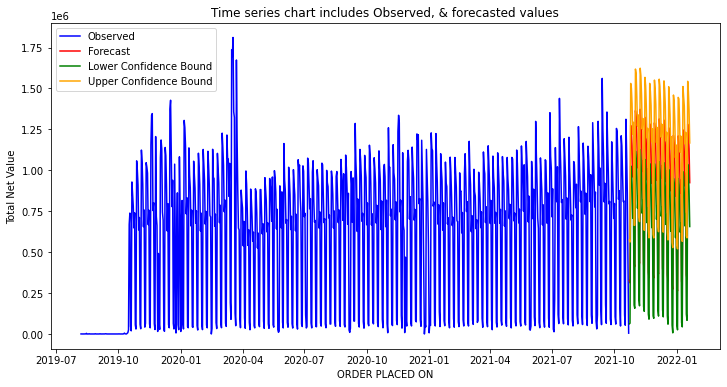

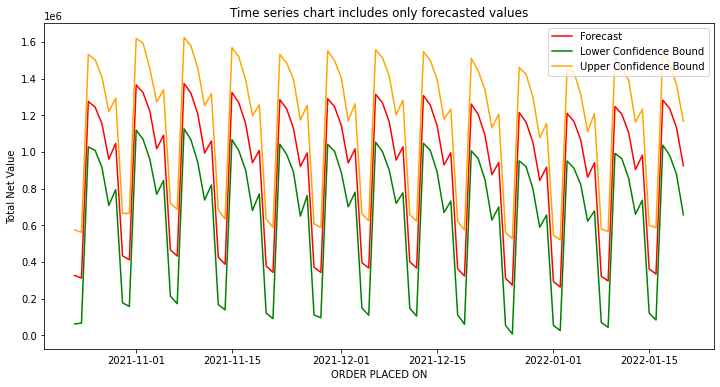

In [ ]:
forecast_next90days = plot_forecasts(df_tot, n_days=90)

In [ ]:
forecast_next90days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,61946.979,574305.731
1,2021-10-24,312354.041,65646.219,561417.207
2,2021-10-25,1274762.992,1027236.375,1530883.993
3,2021-10-26,1243587.644,1008084.443,1502313.600
4,2021-10-27,1152633.461,913918.476,1407361.029
5,2021-10-28,959857.316,707921.646,1219738.025
6,2021-10-29,1046368.210,793933.296,1293532.140
7,2021-10-30,433030.551,176885.697,664111.157
8,2021-10-31,411662.642,156845.096,664816.753
9,2021-11-01,1364843.483,1118318.473,1618614.838


### Forecast the Total net value of all clinics for next 120 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


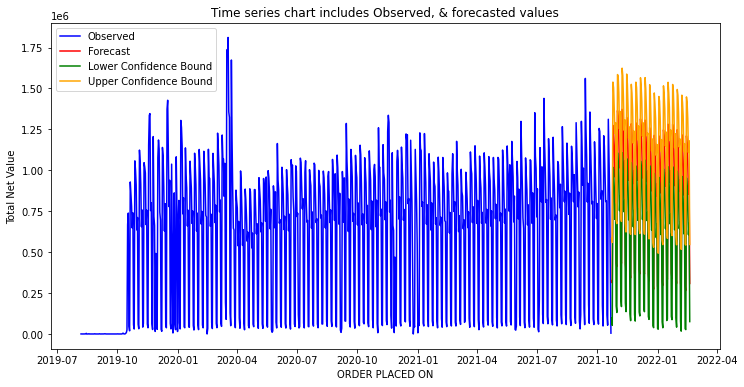

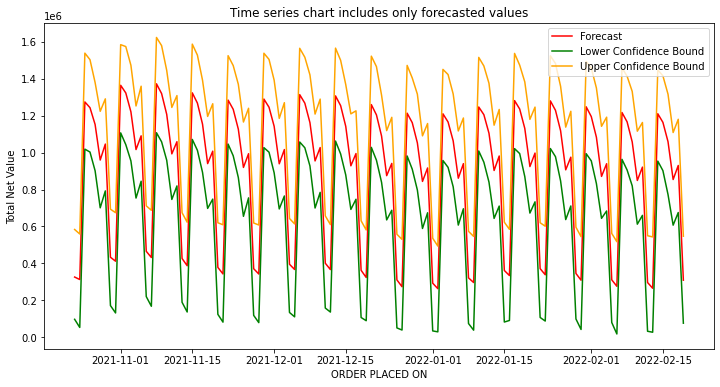

In [ ]:
forecast_next120days = plot_forecasts(df_tot, n_days=120)

In [ ]:
forecast_next120days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,96750.148,583484.244
1,2021-10-24,312354.041,52673.887,559086.477
2,2021-10-25,1274762.992,1018831.880,1539099.868
3,2021-10-26,1243587.644,1003108.019,1503721.740
4,2021-10-27,1152633.461,901877.950,1379930.286
5,2021-10-28,959857.316,700938.912,1223926.570
6,2021-10-29,1046368.210,792537.494,1291401.535
7,2021-10-30,433030.551,171080.098,693645.661
8,2021-10-31,411662.642,131180.995,674453.595
9,2021-11-01,1364843.483,1107036.422,1585053.738


### Forecast the Total net value of all clinics for next 150 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


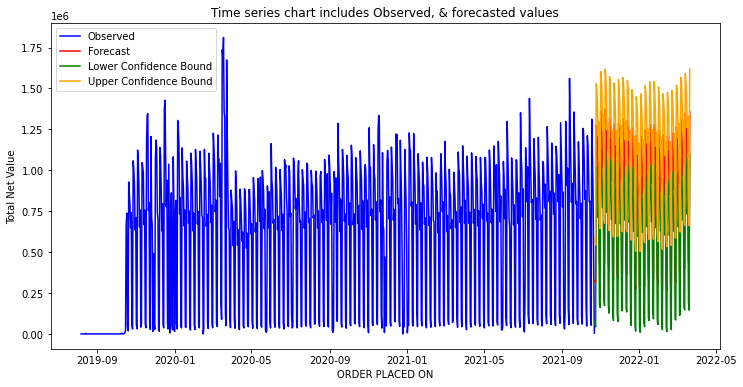

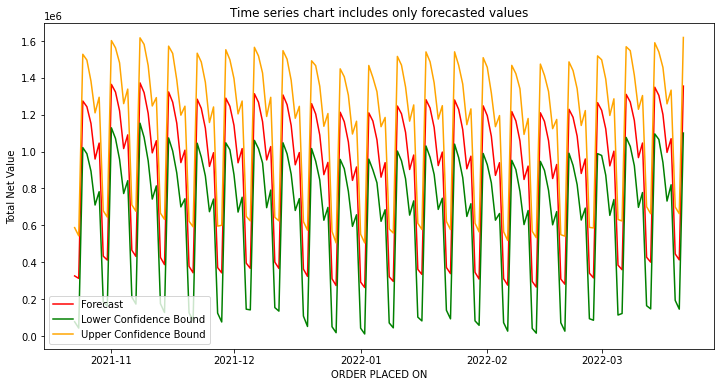

In [ ]:
forecast_next150days = plot_forecasts(df_tot, n_days=150)

In [ ]:
forecast_next150days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,76855.298,587724.699
1,2021-10-24,312354.041,42715.079,543174.486
2,2021-10-25,1274762.992,1022004.074,1528158.625
3,2021-10-26,1243587.644,988550.755,1496727.084
4,2021-10-27,1152633.461,893934.501,1382013.579
5,2021-10-28,959857.316,710351.817,1210430.734
6,2021-10-29,1046368.210,782606.109,1295117.483
7,2021-10-30,433030.551,185529.148,679040.101
8,2021-10-31,411662.642,162002.275,644580.672
9,2021-11-01,1364843.483,1129198.932,1602514.169


### Forecast the Total net value of all clinics for next 180 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


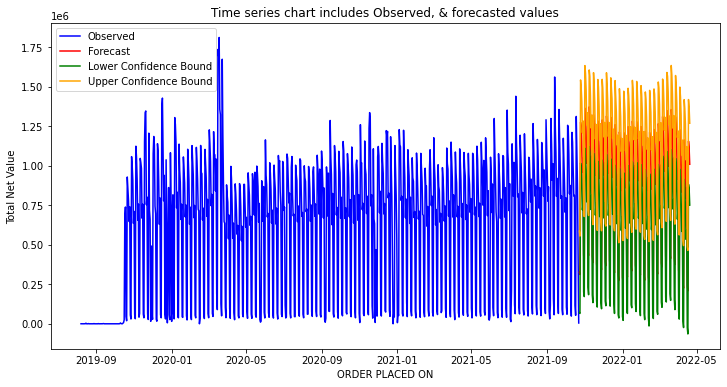

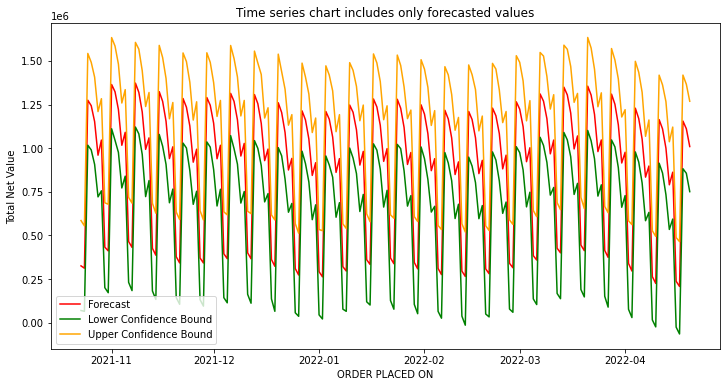

In [ ]:
forecast_next180days = plot_forecasts(df_tot, n_days=180)

In [ ]:
forecast_next180days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,70026.346,585449.127
1,2021-10-24,312354.041,65308.262,554742.015
2,2021-10-25,1274762.992,1017020.725,1542853.457
3,2021-10-26,1243587.644,990188.034,1492060.447
4,2021-10-27,1152633.461,907274.719,1407233.684
5,2021-10-28,959857.316,721022.121,1209554.067
6,2021-10-29,1046368.210,755761.049,1283548.529
7,2021-10-30,433030.551,200932.631,687316.287
8,2021-10-31,411662.642,171876.333,678781.013
9,2021-11-01,1364843.483,1111214.228,1633729.851


### Forecast the Total net value of all clinics for next 210 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


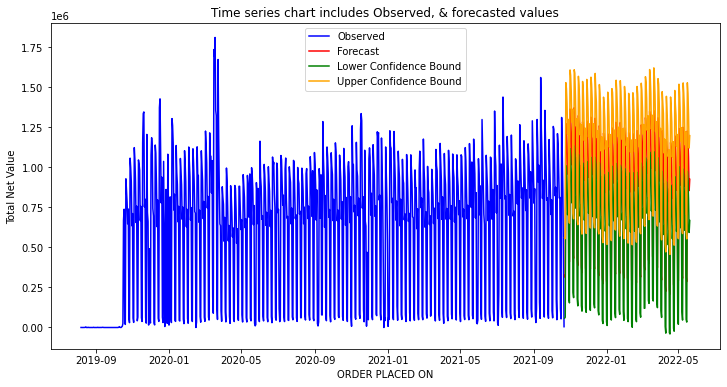

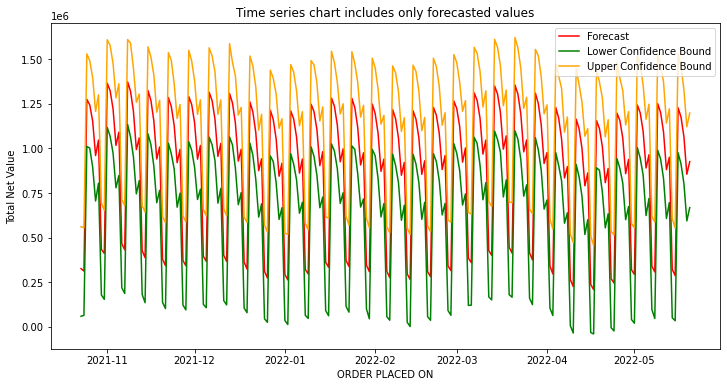

In [ ]:
forecast_next210days = plot_forecasts(df_tot, n_days=210)

In [ ]:
forecast_next210days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,58696.350,560411.057
1,2021-10-24,312354.041,63872.047,555253.668
2,2021-10-25,1274762.992,1011401.980,1529368.382
3,2021-10-26,1243587.644,1001201.676,1491344.085
4,2021-10-27,1152633.461,895031.351,1397042.382
5,2021-10-28,959857.316,705108.854,1207256.924
6,2021-10-29,1046368.210,804662.966,1299971.503
7,2021-10-30,433030.551,178103.639,692833.259
8,2021-10-31,411662.642,153671.855,652102.375
9,2021-11-01,1364843.483,1117388.195,1608783.337


### Forecast the Total net value of all clinics for next 240 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


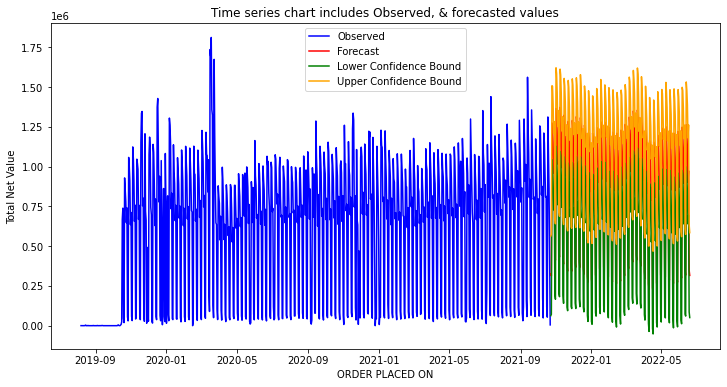

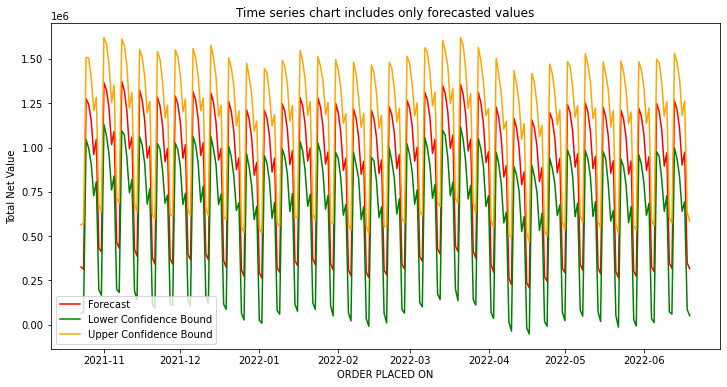

In [ ]:
forecast_next240days = plot_forecasts(df_tot, n_days=240)

In [ ]:
forecast_next240days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,62971.358,563666.092
1,2021-10-24,312354.041,71454.212,574276.749
2,2021-10-25,1274762.992,1043441.930,1508251.209
3,2021-10-26,1243587.644,996460.274,1504720.811
4,2021-10-27,1152633.461,908921.610,1393363.383
5,2021-10-28,959857.316,728051.286,1208334.260
6,2021-10-29,1046368.210,806842.426,1283291.388
7,2021-10-30,433030.551,197471.969,677324.576
8,2021-10-31,411662.642,166101.622,640494.105
9,2021-11-01,1364843.483,1128834.703,1620970.072


### Forecast the Total net value of all clinics for next 270 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


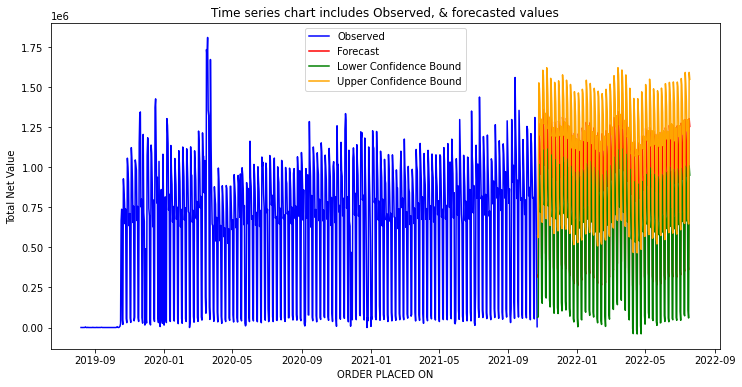

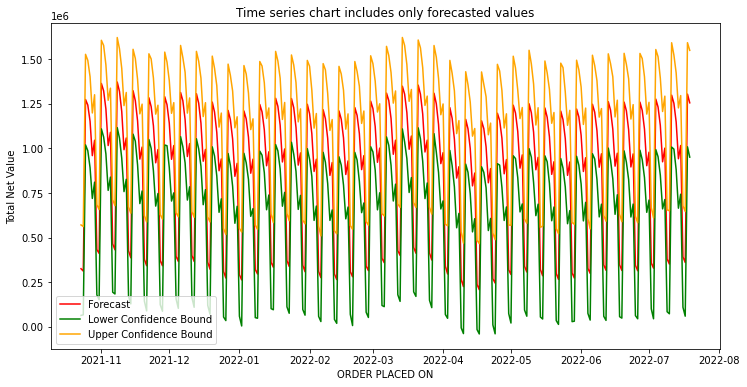

In [ ]:
forecast_next270days = plot_forecasts(df_tot, n_days=270)

In [ ]:
forecast_next270days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,63909.077,571293.417
1,2021-10-24,312354.041,67115.616,562257.956
2,2021-10-25,1274762.992,1020147.588,1528191.200
3,2021-10-26,1243587.644,987628.744,1494211.313
4,2021-10-27,1152633.461,892529.163,1402862.838
5,2021-10-28,959857.316,719838.263,1199329.108
6,2021-10-29,1046368.210,811247.888,1301560.687
7,2021-10-30,433030.551,179436.297,685189.505
8,2021-10-31,411662.642,151460.119,657394.984
9,2021-11-01,1364843.483,1109982.865,1606868.529


### Forecast the Total net value of all clinics for next 300 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


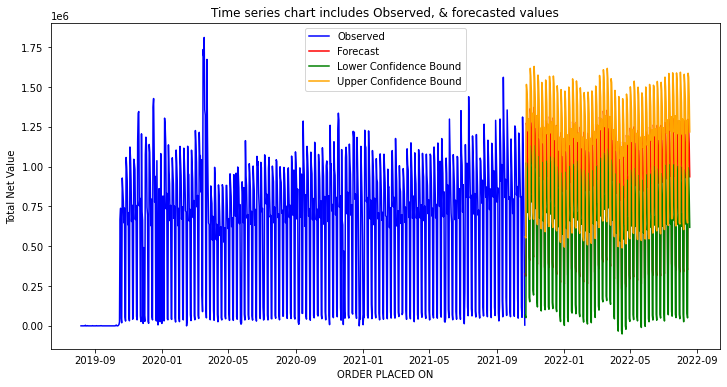

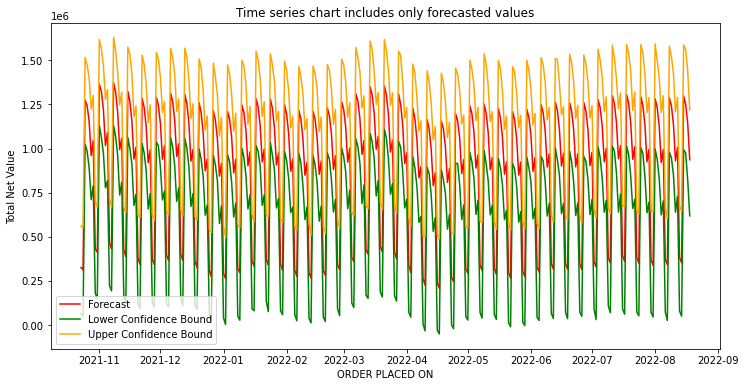

In [ ]:
forecast_next300days = plot_forecasts(df_tot, n_days=300)

In [ ]:
forecast_next300days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,64683.259,559472.822
1,2021-10-24,312354.041,51186.275,552113.947
2,2021-10-25,1274762.992,1024800.036,1516768.562
3,2021-10-26,1243587.644,985603.942,1472673.677
4,2021-10-27,1152633.461,891243.336,1401020.445
5,2021-10-28,959857.316,710752.411,1223767.411
6,2021-10-29,1046368.210,789249.338,1300828.482
7,2021-10-30,433030.551,179284.973,696203.100
8,2021-10-31,411662.642,151503.463,669465.613
9,2021-11-01,1364843.483,1129439.792,1618097.755


### Forecast the Total net value of all clinics for next 330 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


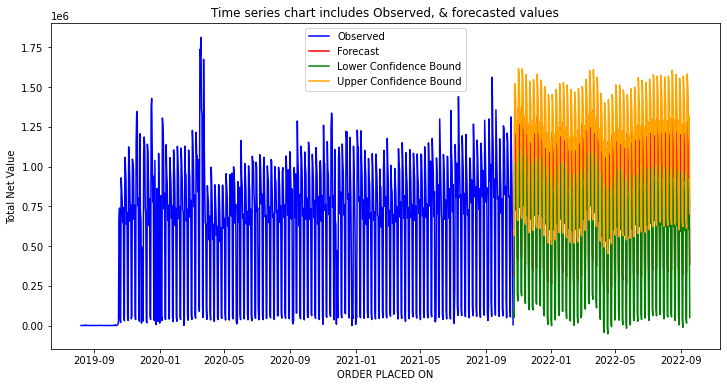

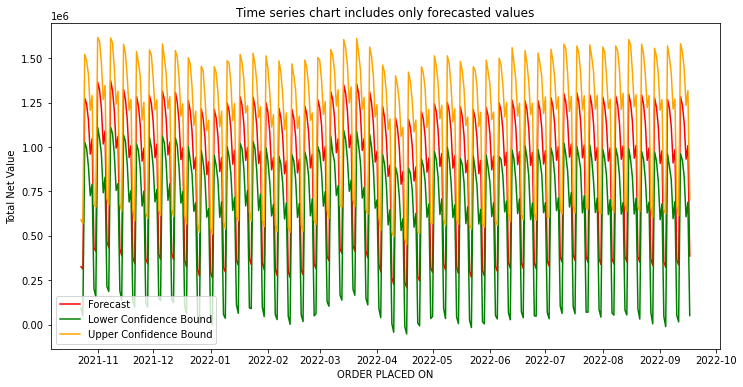

In [ ]:
forecast_next330days = plot_forecasts(df_tot, n_days=330)

In [ ]:
forecast_next330days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,91428.557,589059.605
1,2021-10-24,312354.041,51302.321,567674.802
2,2021-10-25,1274762.992,1028107.474,1521953.419
3,2021-10-26,1243587.644,993777.910,1485462.234
4,2021-10-27,1152633.461,891111.928,1409555.167
5,2021-10-28,959857.316,725020.154,1206390.547
6,2021-10-29,1046368.210,790347.953,1289823.459
7,2021-10-30,433030.551,202487.429,674727.185
8,2021-10-31,411662.642,155157.541,661890.219
9,2021-11-01,1364843.483,1110989.744,1616699.982


### Forecast the Total net value of all clinics for next 365 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


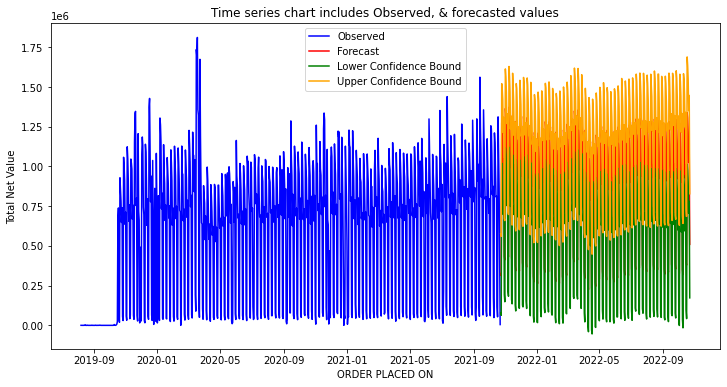

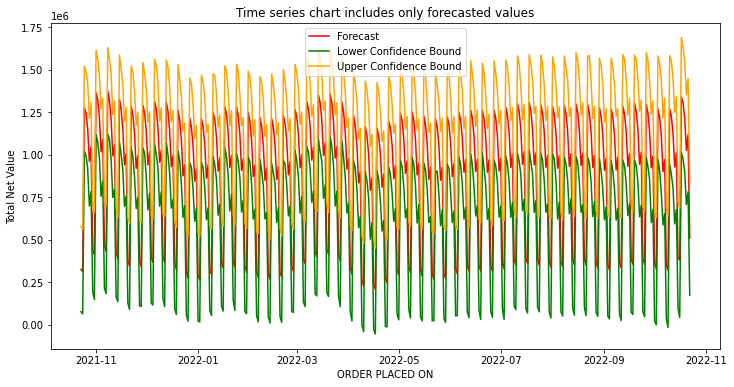

In [ ]:
forecast_next365days = plot_forecasts(df_tot, n_days=365)

In [ ]:
forecast_next365days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-23,325750.115,76787.833,575534.760
1,2021-10-24,312354.041,63220.584,559919.714
2,2021-10-25,1274762.992,1021657.963,1520971.923
3,2021-10-26,1243587.644,994780.478,1488667.017
4,2021-10-27,1152633.461,917010.508,1421347.422
5,2021-10-28,959857.316,697899.239,1213286.890
6,2021-10-29,1046368.210,782644.513,1308496.924
7,2021-10-30,433030.551,193326.372,672229.920
8,2021-10-31,411662.642,148328.174,659346.619
9,2021-11-01,1364843.483,1117769.661,1613684.359


## **Time series model to forecast the Total Net value of the clinic 610937**

In [ ]:
# Take a copy of df_tot
df_tot1 = df_tot.copy()
df_tot1['ACCOUNT_NUMBER'] = df['ACCOUNT_NUMBER']
df_tot1.head()

,ORDER_PLACED_ON,TOTAL_NET_VALUE,ACCOUNT_NUMBER
0,2021-10-12,354.560,856898
1,2021-10-19,579.240,856898
2,2021-10-18,363.880,856920
3,2021-10-12,589.000,856919
4,2021-10-20,795.540,857103


In [ ]:
# Filter the data for clinic 610937
df_tot1 = df_tot1[df_tot1['ACCOUNT_NUMBER']==610937]
df_tot1.head()

,ORDER_PLACED_ON,TOTAL_NET_VALUE,ACCOUNT_NUMBER
81855,2020-12-22,278.980,610937
81856,2020-09-21,596.020,610937
81857,2021-04-01,1077.760,610937
81858,2020-04-09,190.740,610937
81859,2020-02-17,427.840,610937


Now, let's create train & test data. We will consider the **last 3 months data** as test data for evaluating model performance.

In [ ]:
df_tot1.drop(['ACCOUNT_NUMBER'], axis=1, inplace=True)
train_data1 = df_tot1[df_tot1['ORDER_PLACED_ON']<'2021-04-01']
test_data1 = df_tot1[df_tot1['ORDER_PLACED_ON']>='2021-04-01']

In [ ]:
train_data1.shape, test_data1.shape

((189, 2), (52, 2))

In [ ]:
# Set ORDER_PLACED_ON  as index 
train1 = train_data1.set_index('ORDER_PLACED_ON')
test1 = test_data1.set_index('ORDER_PLACED_ON')
# Resample the data daily
train1 = train1.resample('D').sum()
test1 = test1.resample('D').sum()
# Specify datetime frequency
train1 = train1.asfreq('D')
test1 = test1.asfreq('D')

In [ ]:
train1.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2019-10-18,269.350
2019-10-19,0.000
2019-10-20,0.000
2019-10-21,0.000
2019-10-22,174.370


In [ ]:
test1.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2021-04-01,1077.760
2021-04-02,0.000
2021-04-03,0.000
2021-04-04,0.000
2021-04-05,0.000


**Visualizing the time series in train1**

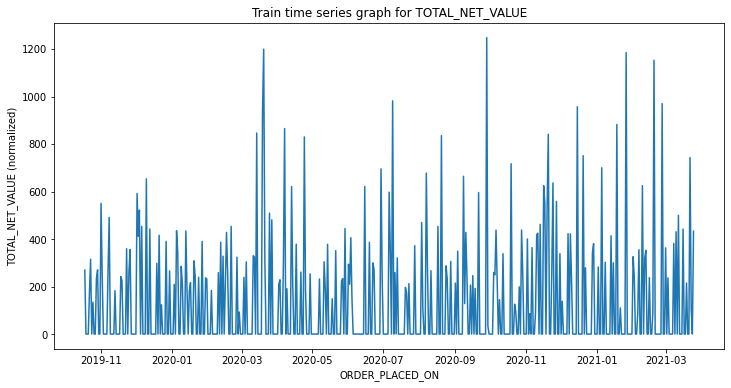

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Train time series graph for TOTAL_NET_VALUE")
plt.plot(train1);

**Visualizing the time series in test1**

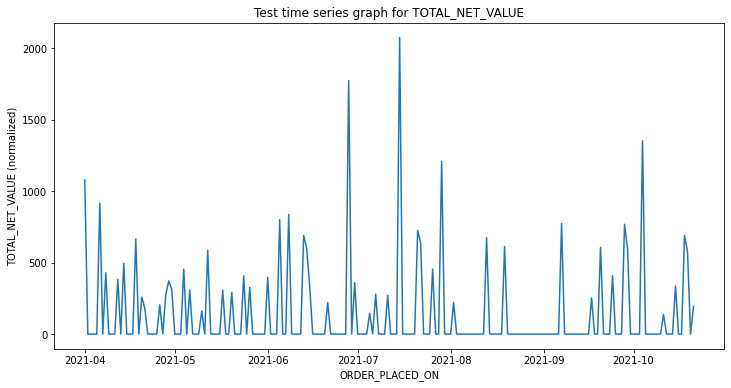

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Test time series graph for TOTAL_NET_VALUE")
plt.plot(test1);

In [ ]:
train_df1 = train1.copy().reset_index(drop=False)
test_df1 = test1.copy().reset_index(drop=False)

# prepare expected column names
train_df1.columns = ['ds', 'y']
test_df1.columns = ['ds', 'y']

Now, train the **Prophet** model

In [ ]:
# define the model
model1 = Prophet()              
# fit the model
model1.fit(train_df1)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, let's make a **forecast on test data**

MAE: 209.690


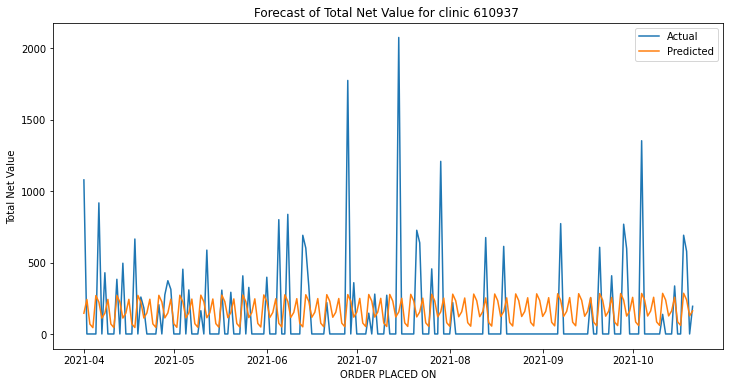

In [ ]:
# use the model to make a forecast on test data
forecast1 = model1.predict(test_df1)
# calculate MAE between expected and predicted values for test data
y_true = test_df1['y'].values
y_pred = forecast1['yhat'].values
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
# plot expected vs actual
plt.figure(figsize=(12, 6))
plt.plot(test_df1['ds'], y_true, label='Actual')
plt.plot(test_df1['ds'], y_pred, label='Predicted')
plt.xlabel('ORDER PLACED ON')
plt.ylabel('Total Net Value')
plt.title('Forecast of Total Net Value for clinic 610937 ')
plt.legend()
plt.show()

In [ ]:
forecasted_revenue1 = forecast1['yhat'].astype(float).values
actual_revenue1 = test_df1['y'].values
# Reshape arrays
forecasted_revenue1 = forecasted_revenue1.reshape((len(forecasted_revenue1),1))
actual_revenue1 = actual_revenue1.reshape((len(actual_revenue1),1))
test_df1['forecasted revenue'] = scaler.inverse_transform(forecasted_revenue1).flatten()
test_df1['y'] = scaler.inverse_transform(actual_revenue1).flatten()
test_df1 = test_df1.rename(columns={'y':'Actual revenue'})
test_df1.tail()

,ds,Actual revenue,forecasted revenue
199,2021-10-17,232.990,488598496.248
200,2021-10-18,5595735000.030,2307163359.980
201,2021-10-19,4682418417.830,1933734123.296
202,2021-10-20,232.990,1027427410.506
203,2021-10-21,1568231632.670,1310032403.169


Model performance on test data is okay but not good. This may due to the lack of data for the training. We can see model is not predicting well at peaks. It seems those peaks represent the holidays, hence the model is not capturing well.

Now, forecast the total net value for next 30days, 60 days,.... upto a year. Let's define some helper functions.

### Forecast the Total net value of the clinic 610937 for next 30 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


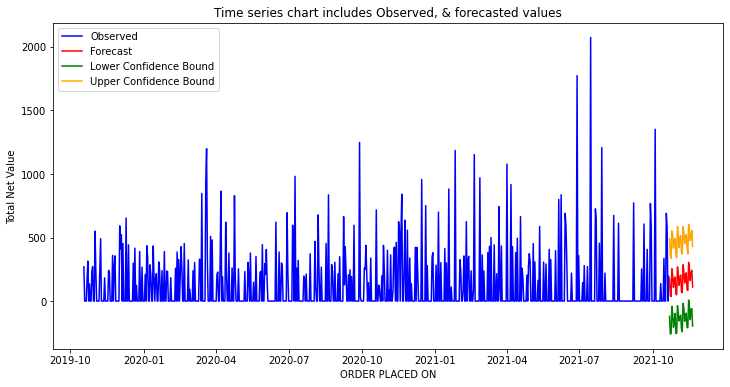

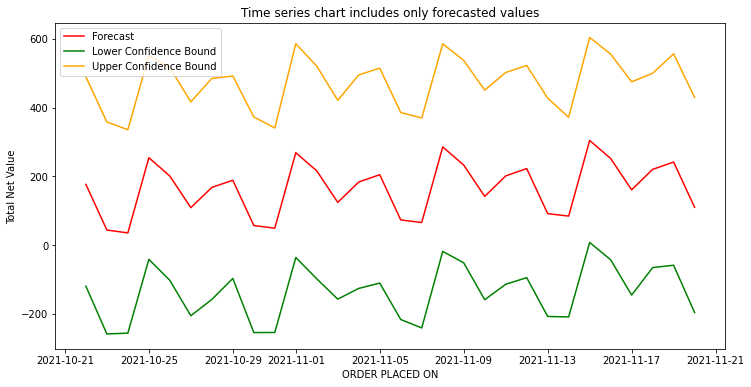

In [ ]:
forecast_next30days = plot_forecasts(df_tot1, n_days=30)

In [ ]:
forecast_next30days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-119.796,489.619
1,2021-10-23,43.715,-258.872,358.118
2,2021-10-24,35.294,-256.433,335.757
3,2021-10-25,254.322,-41.669,552.049
4,2021-10-26,200.832,-102.916,516.020
5,2021-10-27,108.788,-205.833,416.850
6,2021-10-28,167.799,-158.339,484.984
7,2021-10-29,188.655,-97.316,492.037
8,2021-10-30,56.790,-254.744,372.874
9,2021-10-31,49.164,-254.529,340.841


### Forecast the Total net value of the clinic 610937 for next 60 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


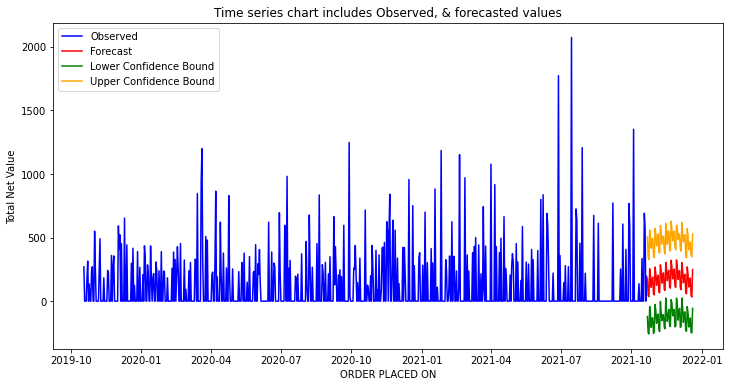

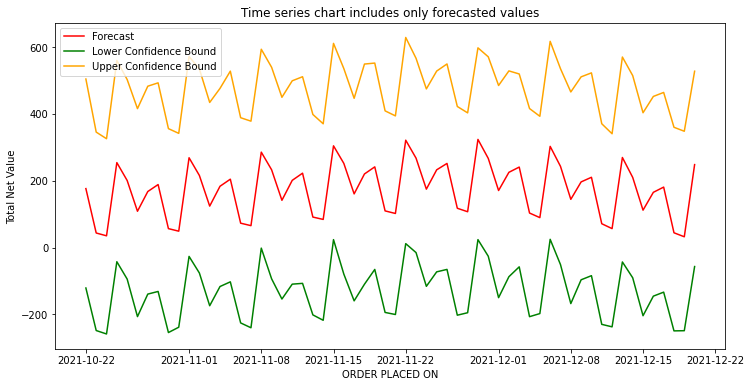

In [ ]:
forecast_next60days = plot_forecasts(df_tot1, n_days=60)

In [ ]:
forecast_next60days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-120.845,504.375
1,2021-10-23,43.715,-248.094,345.567
2,2021-10-24,35.294,-258.387,325.798
3,2021-10-25,254.322,-42.200,559.898
4,2021-10-26,200.832,-94.111,502.896
5,2021-10-27,108.788,-206.415,415.818
6,2021-10-28,167.799,-139.064,482.912
7,2021-10-29,188.655,-131.174,492.974
8,2021-10-30,56.790,-254.119,355.977
9,2021-10-31,49.164,-238.171,341.826


### Forecast the Total net value of the clinic 610937 for next 90 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


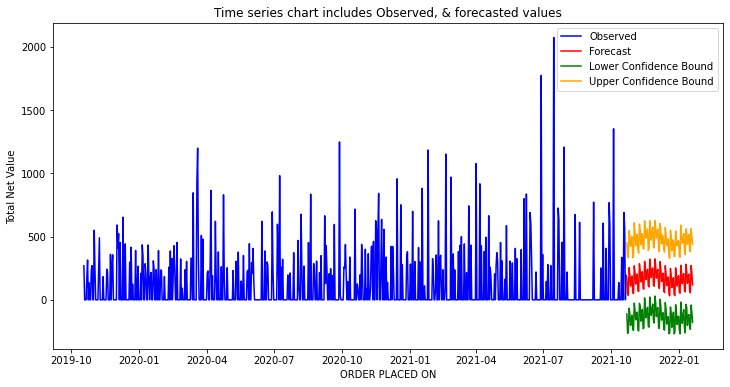

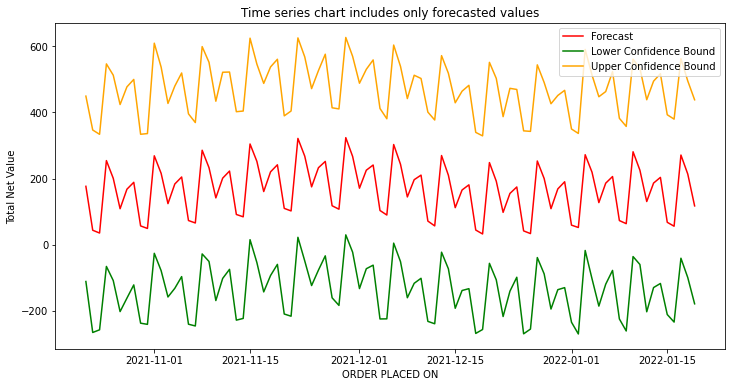

In [ ]:
forecast_next90days= plot_forecasts(df_tot1, n_days=90)

In [ ]:
forecast_next90days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-111.261,449.290
1,2021-10-23,43.715,-265.427,346.824
2,2021-10-24,35.294,-257.346,333.795
3,2021-10-25,254.322,-65.695,546.724
4,2021-10-26,200.832,-108.410,512.654
5,2021-10-27,108.788,-202.266,423.853
6,2021-10-28,167.799,-161.624,477.302
7,2021-10-29,188.655,-121.566,499.761
8,2021-10-30,56.790,-237.293,333.968
9,2021-10-31,49.164,-240.851,336.003


### Forecast the Total net value of the clinic 610937 for next 120 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


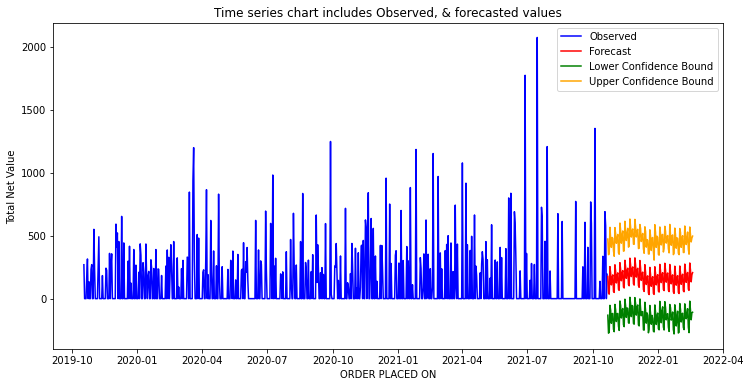

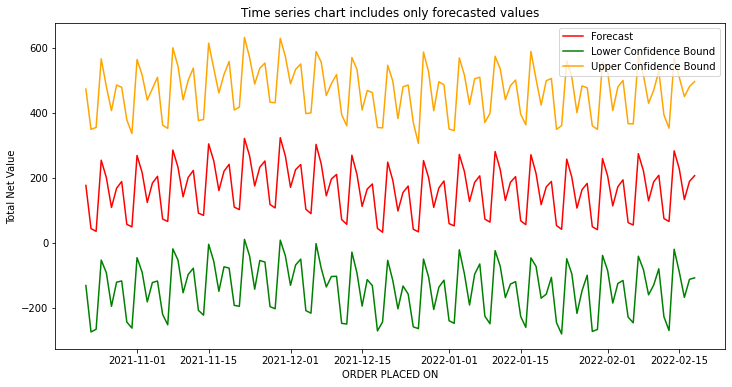

In [ ]:
forecast_next120days = plot_forecasts(df_tot1, n_days=120)

In [ ]:
forecast_next120days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-131.692,473.362
1,2021-10-23,43.715,-274.665,349.260
2,2021-10-24,35.294,-266.331,355.195
3,2021-10-25,254.322,-53.318,566.474
4,2021-10-26,200.832,-92.238,480.993
5,2021-10-27,108.788,-195.777,406.899
6,2021-10-28,167.799,-121.442,485.883
7,2021-10-29,188.655,-117.536,478.637
8,2021-10-30,56.790,-244.057,378.781
9,2021-10-31,49.164,-262.749,336.373


### Forecast the Total net value of the clinic 610937 for next 150 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


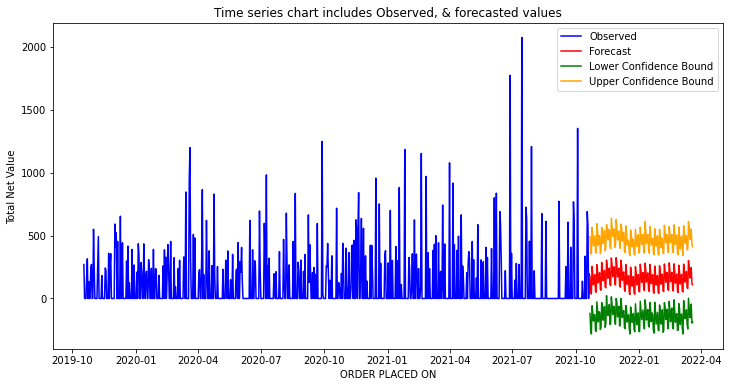

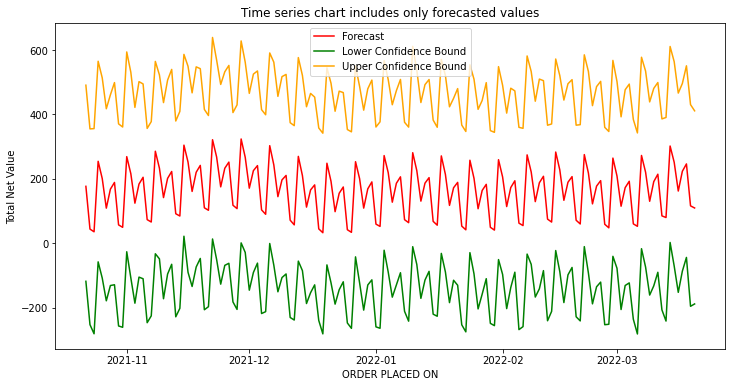

In [ ]:
forecast_next150days= plot_forecasts(df_tot1, n_days=150)

In [ ]:
forecast_next150days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-118.524,490.843
1,2021-10-23,43.715,-253.189,355.062
2,2021-10-24,35.294,-281.579,355.880
3,2021-10-25,254.322,-58.109,565.175
4,2021-10-26,200.832,-108.392,513.698
5,2021-10-27,108.788,-179.091,417.602
6,2021-10-28,167.799,-131.633,460.833
7,2021-10-29,188.655,-129.250,498.934
8,2021-10-30,56.790,-257.299,370.643
9,2021-10-31,49.164,-261.452,360.951


### Forecast the Total net value of the clinic 610937 for next 180 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


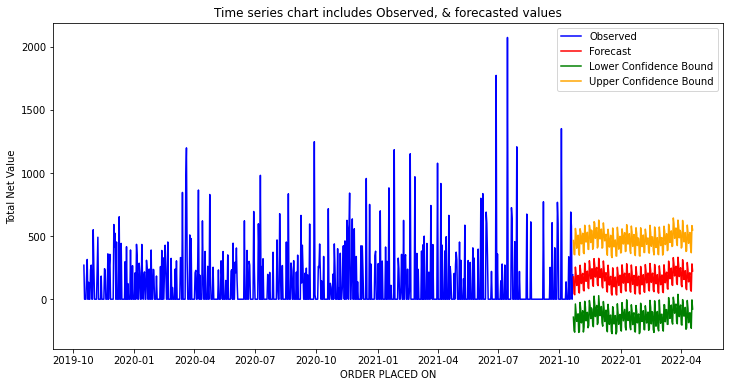

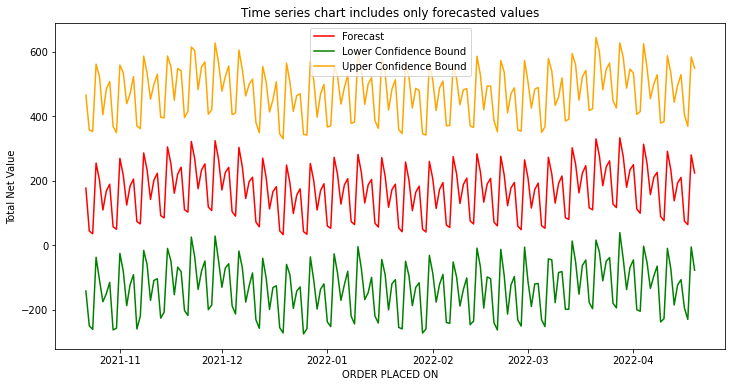

In [ ]:
forecast_next180days = plot_forecasts(df_tot1, n_days=180)

In [ ]:
forecast_next180days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-142.239,465.208
1,2021-10-23,43.715,-250.241,356.983
2,2021-10-24,35.294,-261.415,352.259
3,2021-10-25,254.322,-37.784,560.825
4,2021-10-26,200.832,-108.522,522.402
5,2021-10-27,108.788,-175.584,404.256
6,2021-10-28,167.799,-151.095,483.363
7,2021-10-29,188.655,-115.624,507.374
8,2021-10-30,56.790,-263.008,367.985
9,2021-10-31,49.164,-257.654,348.560


### Forecast the Total net value of the clinic 610937 for next 210 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


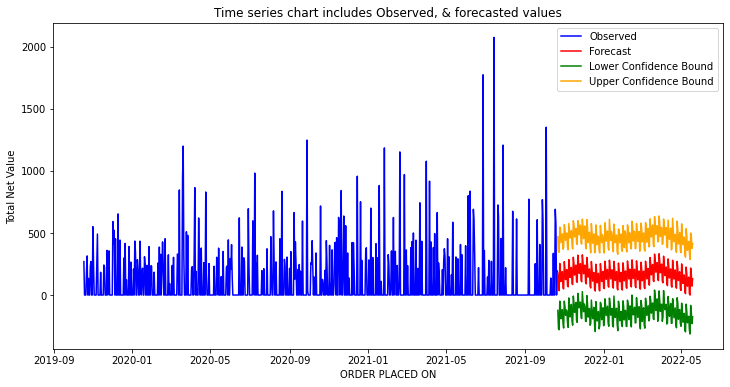

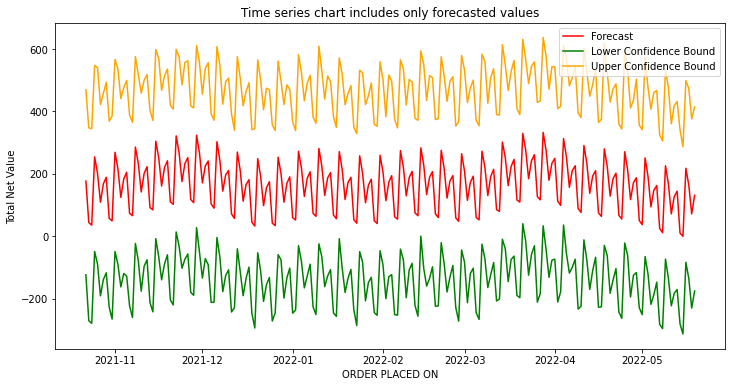

In [ ]:
forecast_next210days = plot_forecasts(df_tot1, n_days=210)

In [ ]:
forecast_next210days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-123.791,468.960
1,2021-10-23,43.715,-271.190,347.467
2,2021-10-24,35.294,-279.441,344.195
3,2021-10-25,254.322,-49.118,546.970
4,2021-10-26,200.832,-89.600,540.691
5,2021-10-27,108.788,-191.288,422.053
6,2021-10-28,167.799,-139.069,458.343
7,2021-10-29,188.655,-117.600,493.391
8,2021-10-30,56.790,-227.404,368.675
9,2021-10-31,49.164,-265.785,385.150


### Forecast the Total net value of the clinic 610937 for next 240 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


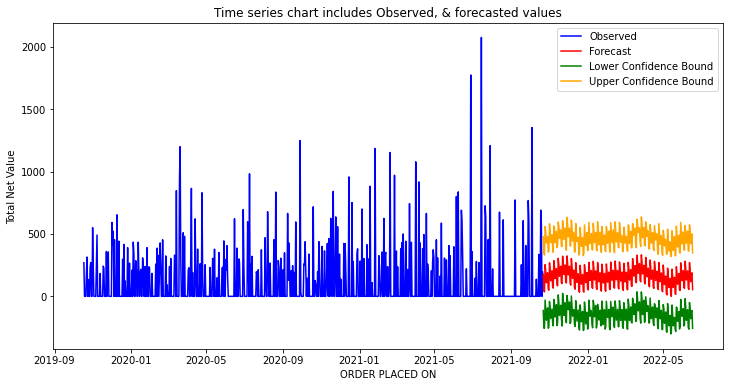

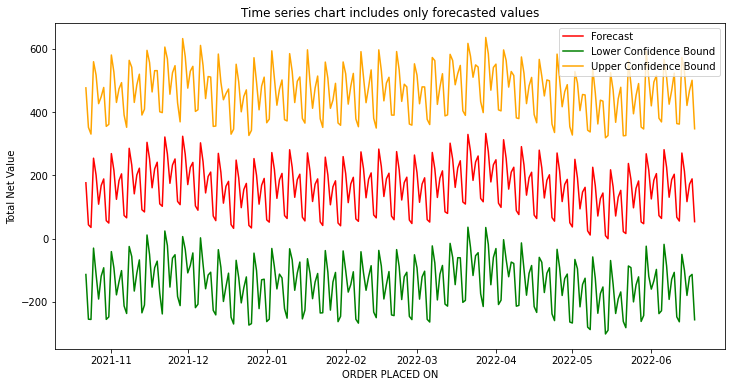

In [ ]:
forecast_next240days = plot_forecasts(df_tot1, n_days=240)

In [ ]:
forecast_next240days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-113.608,476.810
1,2021-10-23,43.715,-254.993,352.123
2,2021-10-24,35.294,-255.819,330.574
3,2021-10-25,254.322,-30.110,559.536
4,2021-10-26,200.832,-113.009,517.293
5,2021-10-27,108.788,-191.237,426.840
6,2021-10-28,167.799,-119.096,448.575
7,2021-10-29,188.655,-92.321,478.078
8,2021-10-30,56.790,-255.550,355.053
9,2021-10-31,49.164,-247.801,361.302


### Forecast the Total net value of the clinic 610937 for next 270 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


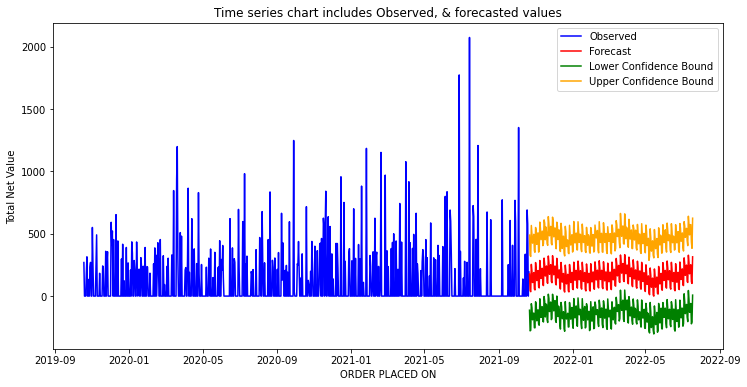

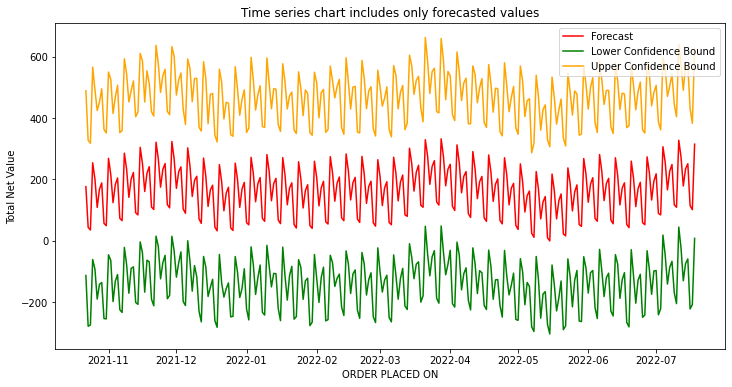

In [ ]:
forecast_next270days = plot_forecasts(df_tot1, n_days=270)

In [ ]:
forecast_next270days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-113.303,489.244
1,2021-10-23,43.715,-278.703,327.841
2,2021-10-24,35.294,-274.546,317.990
3,2021-10-25,254.322,-61.036,566.306
4,2021-10-26,200.832,-92.534,492.629
5,2021-10-27,108.788,-190.161,424.702
6,2021-10-28,167.799,-142.097,451.623
7,2021-10-29,188.655,-136.248,495.551
8,2021-10-30,56.790,-253.772,362.879
9,2021-10-31,49.164,-254.559,351.277


### Forecast the Total net value of the clinic 610937 for next 300 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


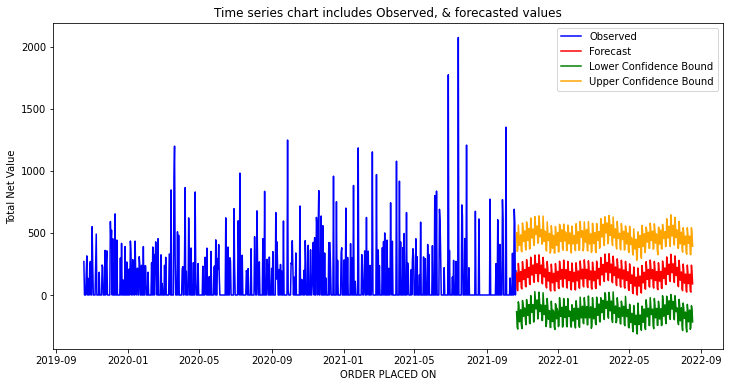

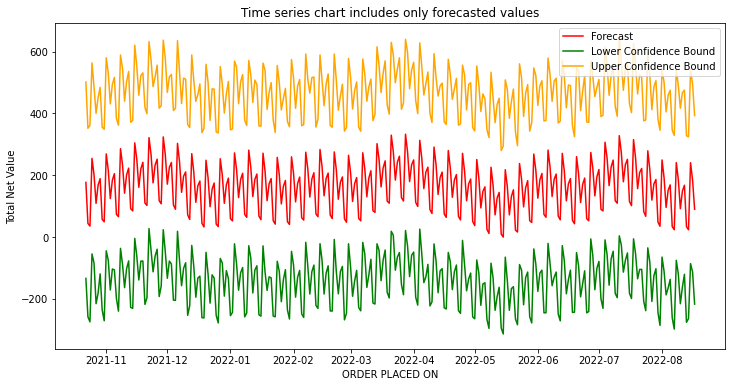

In [ ]:
forecast_next300days = plot_forecasts(df_tot1, n_days=300)

In [ ]:
forecast_next300days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-134.066,501.467
1,2021-10-23,43.715,-258.533,351.496
2,2021-10-24,35.294,-274.704,361.849
3,2021-10-25,254.322,-54.880,563.285
4,2021-10-26,200.832,-84.659,485.299
5,2021-10-27,108.788,-215.876,400.065
6,2021-10-28,167.799,-182.229,450.760
7,2021-10-29,188.655,-119.418,484.204
8,2021-10-30,56.790,-236.271,355.343
9,2021-10-31,49.164,-271.238,348.606


### Forecast the Total net value of the clinic 610937 for next 330 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


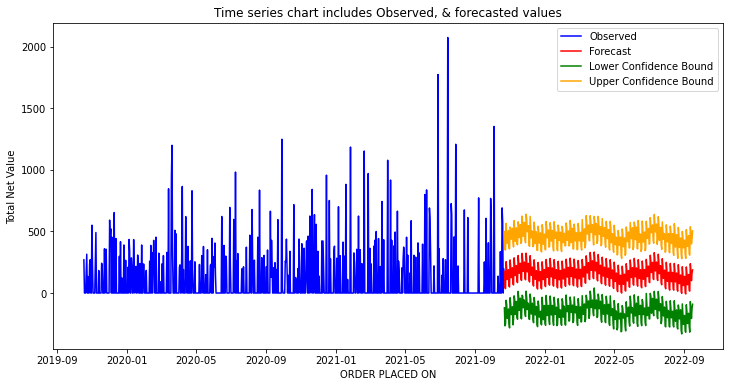

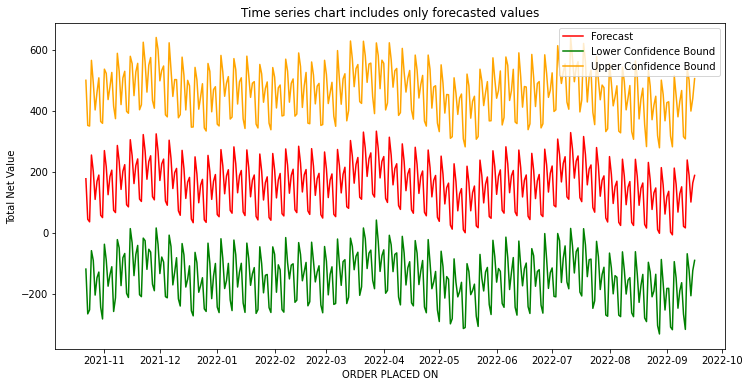

In [ ]:
forecast_next330days = plot_forecasts(df_tot1, n_days=330)

In [ ]:
forecast_next330days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-119.659,499.334
1,2021-10-23,43.715,-266.474,351.465
2,2021-10-24,35.294,-253.188,349.295
3,2021-10-25,254.322,-59.201,564.758
4,2021-10-26,200.832,-91.607,491.377
5,2021-10-27,108.788,-204.877,402.155
6,2021-10-28,167.799,-147.970,459.525
7,2021-10-29,188.655,-129.394,507.373
8,2021-10-30,56.790,-244.870,364.225
9,2021-10-31,49.164,-283.145,358.215


### Forecast the Total net value of the clinic 610937 for next 365 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


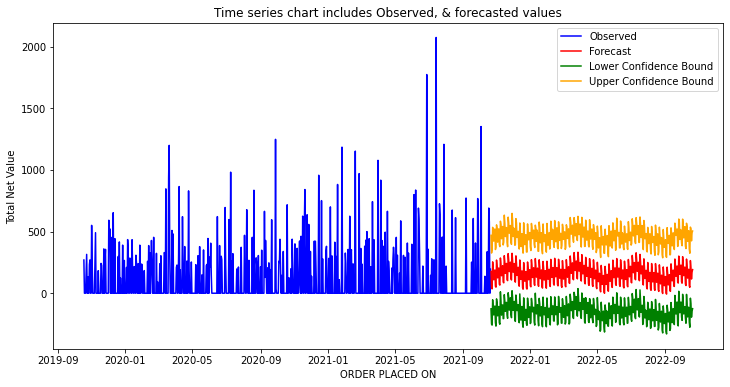

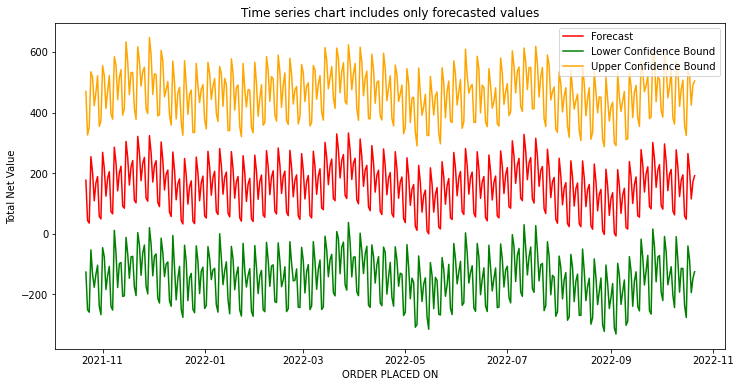

In [ ]:
forecast_next365days = plot_forecasts(df_tot1, n_days=365)

In [ ]:
forecast_next365days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,176.548,-126.373,469.557
1,2021-10-23,43.715,-250.662,325.719
2,2021-10-24,35.294,-258.704,351.653
3,2021-10-25,254.322,-53.309,534.471
4,2021-10-26,200.832,-134.354,515.832
5,2021-10-27,108.788,-176.359,422.668
6,2021-10-28,167.799,-133.856,465.554
7,2021-10-29,188.655,-103.739,520.984
8,2021-10-30,56.790,-238.966,354.159
9,2021-10-31,49.164,-266.907,372.900


## **Time series model to forecast the Total Net value of the clinic 827591**

In [ ]:
# Take a copy of df_tot
df_tot2 = df_tot.copy()
df_tot2['ACCOUNT_NUMBER'] = df['ACCOUNT_NUMBER']
df_tot2.head()

,ORDER_PLACED_ON,TOTAL_NET_VALUE,ACCOUNT_NUMBER
0,2021-10-12,354.560,856898
1,2021-10-19,579.240,856898
2,2021-10-18,363.880,856920
3,2021-10-12,589.000,856919
4,2021-10-20,795.540,857103


In [ ]:
# Filter the data for clinic 610937
df_tot2 = df_tot2[df_tot2['ACCOUNT_NUMBER']==827591]
df_tot2.head()

,ORDER_PLACED_ON,TOTAL_NET_VALUE,ACCOUNT_NUMBER
658363,2020-10-01,112.280,827591
658364,2020-09-23,280.550,827591
658365,2020-03-16,685.310,827591
658366,2020-09-16,175.590,827591
658367,2020-06-01,266.060,827591


Now, let's create train & test data. We will consider the **last 3 months data** as test data for evaluating model performance.

In [ ]:
df_tot2.drop(['ACCOUNT_NUMBER'], axis=1, inplace=True)
train_data2 = df_tot2[df_tot2['ORDER_PLACED_ON']<'2021-04-01']
test_data2 = df_tot2[df_tot2['ORDER_PLACED_ON']>='2021-04-01']

In [ ]:
train_data2.shape, test_data2.shape

((210, 2), (28, 2))

In [ ]:
# Set ORDER_PLACED_ON  as index 
train2 = train_data2.set_index('ORDER_PLACED_ON')
test2 = test_data2.set_index('ORDER_PLACED_ON')
# Resample the data daily
train2 = train2.resample('D').sum()
test2 = test2.resample('D').sum()
# Specify datetime frequency
train2 = train2.asfreq('D')
test2 = test2.asfreq('D')

In [ ]:
train2.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2019-10-21,300.360
2019-10-22,0.000
2019-10-23,0.000
2019-10-24,0.000
2019-10-25,0.000


In [ ]:
test2.head()

,TOTAL_NET_VALUE
ORDER_PLACED_ON,
2021-04-08,653.120
2021-04-09,0.000
2021-04-10,0.000
2021-04-11,0.000
2021-04-12,0.000


**Visualizing the time series in train2**

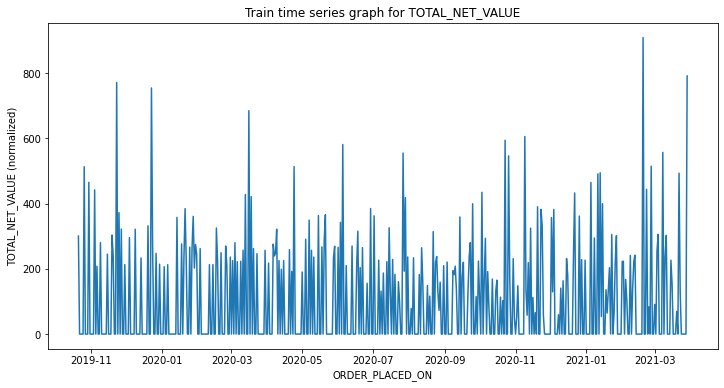

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Train time series graph for TOTAL_NET_VALUE")
plt.plot(train2);

**Visualizing the time series in test2**

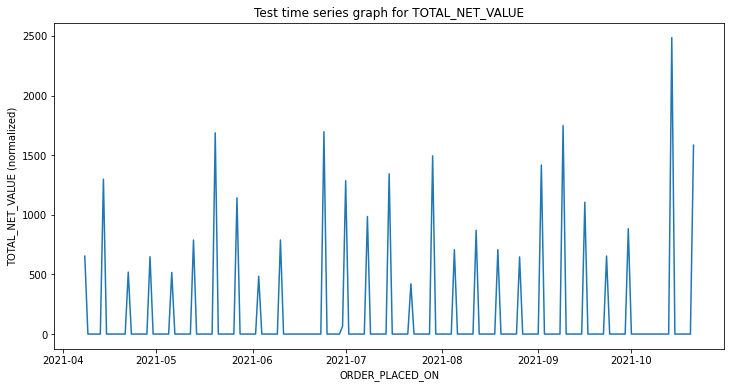

In [ ]:
plt.figure(figsize=(12,6))
plt.xlabel("ORDER_PLACED_ON")
plt.ylabel("TOTAL_NET_VALUE (normalized)")
plt.title("Test time series graph for TOTAL_NET_VALUE")
plt.plot(test2);

In [ ]:
train_df2 = train2.copy().reset_index(drop=False)
test_df2 = test2.copy().reset_index(drop=False)

# prepare expected column names
train_df2.columns = ['ds', 'y']
test_df2.columns = ['ds', 'y']

Now, train the **Prophet** model

In [ ]:
# define the model
model2 = Prophet()              
# fit the model
model2.fit(train_df2)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Now, let's make a **forecast on test data**

MAE: 238.922


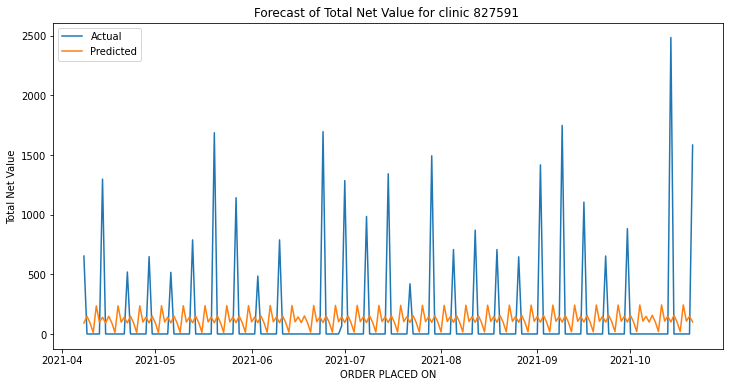

In [ ]:
# use the model to make a forecast on test data
forecast2 = model2.predict(test_df2)
# calculate MAE between expected and predicted values for test data
y_true = test_df2['y'].values
y_pred = forecast2['yhat'].values
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
# plot expected vs actual
plt.figure(figsize=(12, 6))
plt.plot(test_df2['ds'], y_true, label='Actual')
plt.plot(test_df2['ds'], y_pred, label='Predicted')
plt.xlabel('ORDER PLACED ON')
plt.ylabel('Total Net Value')
plt.title('Forecast of Total Net Value for clinic 827591 ')
plt.legend()
plt.show()

In [ ]:
forecasted_revenue2 = forecast2['yhat'].astype(float).values
actual_revenue2 = test_df2['y'].values
# Reshape arrays
# forecasted_revenue2 = forecasted_revenue2.reshape((len(forecasted_revenue2),1))
# actual_revenue2 = actual_revenue2.reshape((len(actual_revenue2),1))
test_df2['forecasted revenue'] = forecasted_revenue2 
test_df2['y'] = actual_revenue2
test_df2 = test_df2.rename(columns={'y':'Actual revenue'})
test_df2.tail()

,ds,Actual revenue,forecasted revenue
192,2021-10-17,0.000,20.280
193,2021-10-18,0.000,244.209
194,2021-10-19,0.000,107.777
195,2021-10-20,0.000,148.397
196,2021-10-21,1583.970,100.801


Model performance on test data is not good. This may due to the lack of data for the training..

Now, forecast the total net value for next 30days, 60 days,.... upto a year. Let's define some helper functions.

### Forecast the Total net value of the clinic 827591 for next 30 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


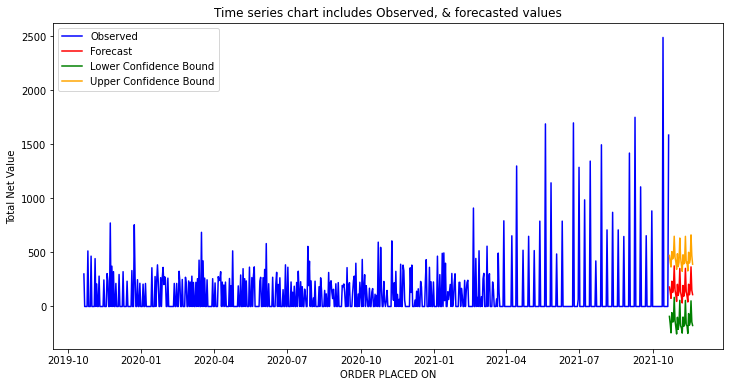

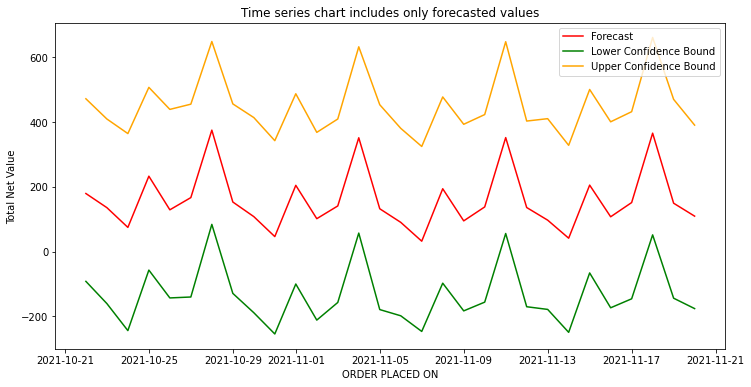

In [ ]:
forecast_next30days = plot_forecasts(df_tot2, n_days=30)

In [ ]:
forecast_next30days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-91.599,472.152
1,2021-10-23,136.019,-160.174,409.730
2,2021-10-24,75.032,-243.647,364.689
3,2021-10-25,233.108,-56.764,507.386
4,2021-10-26,129.316,-142.744,439.363
5,2021-10-27,167.054,-139.883,455.499
6,2021-10-28,375.344,84.352,648.958
7,2021-10-29,153.424,-128.704,456.343
8,2021-10-30,108.309,-188.401,414.169
9,2021-10-31,46.653,-254.029,342.784


### Forecast the Total net value of the clinic 827591 for next 60 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


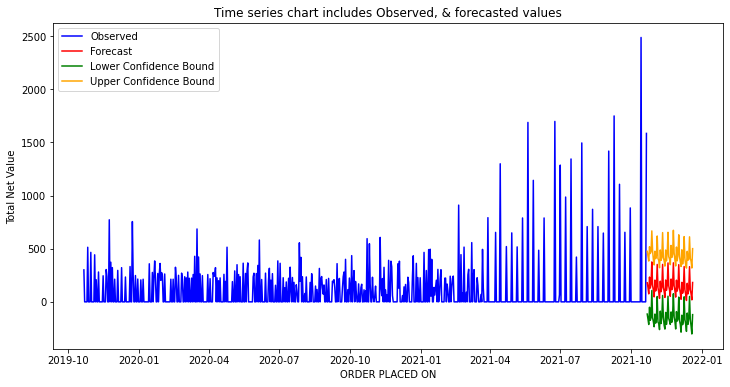

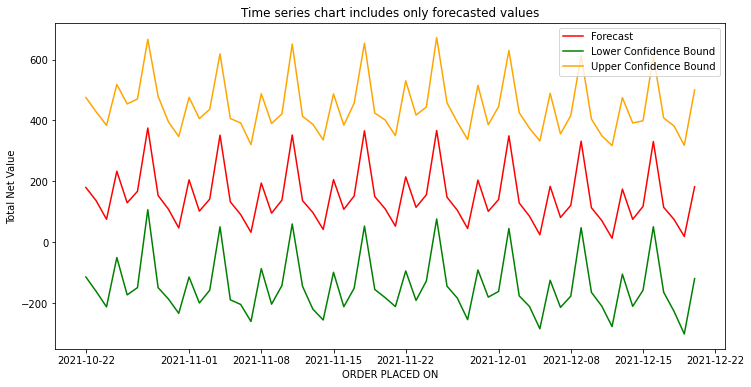

In [ ]:
forecast_next60days = plot_forecasts(df_tot2, n_days=60)

In [ ]:
forecast_next60days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-114.652,475.520
1,2021-10-23,136.019,-162.238,428.380
2,2021-10-24,75.032,-212.986,383.912
3,2021-10-25,233.108,-50.593,518.413
4,2021-10-26,129.316,-173.418,454.427
5,2021-10-27,167.054,-149.678,470.797
6,2021-10-28,375.344,106.575,667.002
7,2021-10-29,153.424,-149.697,479.603
8,2021-10-30,108.309,-186.993,395.773
9,2021-10-31,46.653,-234.187,347.105


### Forecast the Total net value of the clinic 827591 for next 90 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


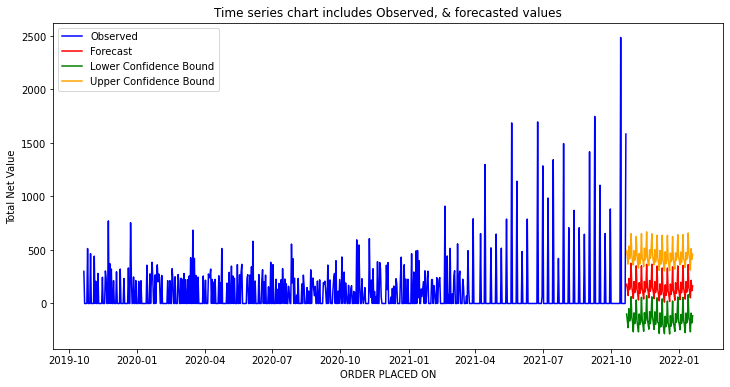

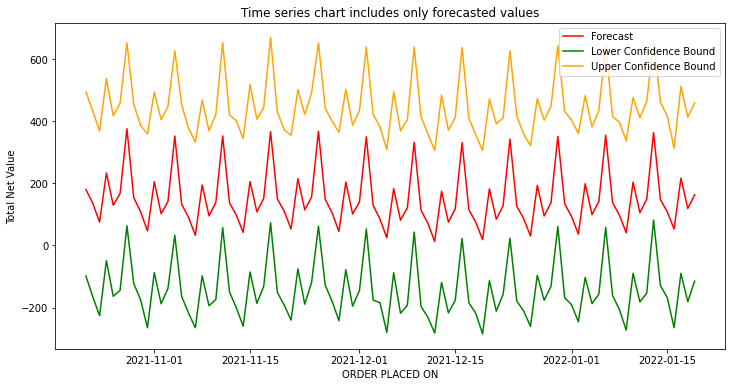

In [ ]:
forecast_next90days = plot_forecasts(df_tot2, n_days=90)

In [ ]:
forecast_next90days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-98.393,493.532
1,2021-10-23,136.019,-164.764,433.125
2,2021-10-24,75.032,-226.114,367.909
3,2021-10-25,233.108,-49.002,536.571
4,2021-10-26,129.316,-163.770,416.713
5,2021-10-27,167.054,-144.472,458.033
6,2021-10-28,375.344,63.227,652.117
7,2021-10-29,153.424,-122.681,454.024
8,2021-10-30,108.309,-174.968,385.668
9,2021-10-31,46.653,-264.989,358.878


### Forecast the Total net value of the clinic 827591 for next 120 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


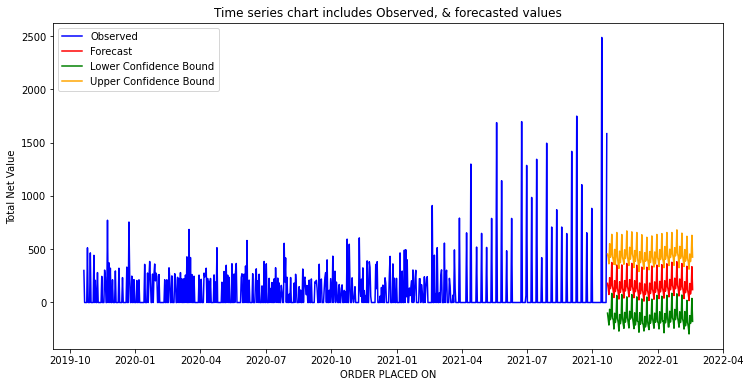

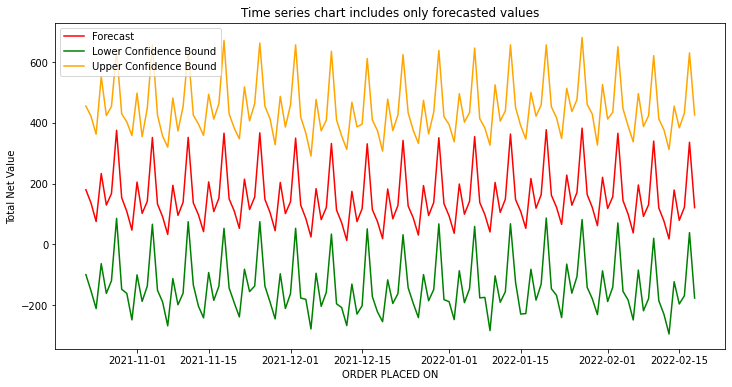

In [ ]:
forecast_next120days = plot_forecasts(df_tot2, n_days=120)

In [ ]:
forecast_next120days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-99.822,455.176
1,2021-10-23,136.019,-153.214,421.956
2,2021-10-24,75.032,-211.602,362.600
3,2021-10-25,233.108,-63.772,552.127
4,2021-10-26,129.316,-161.573,423.892
5,2021-10-27,167.054,-120.113,453.919
6,2021-10-28,375.344,85.369,639.291
7,2021-10-29,153.424,-148.036,429.579
8,2021-10-30,108.309,-161.766,402.865
9,2021-10-31,46.653,-248.874,358.181


### Forecast the Total net value of the clinic 827591 for next 150 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


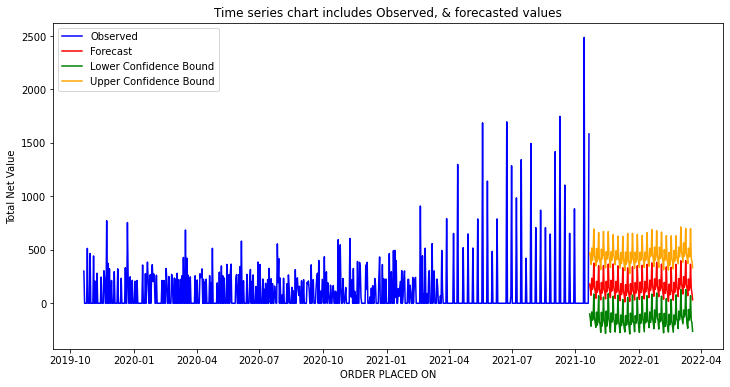

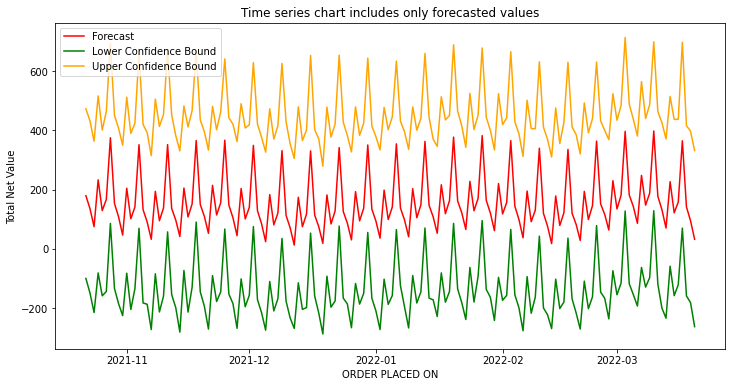

In [ ]:
forecast_next150days = plot_forecasts(df_tot2, n_days=150)

In [ ]:
forecast_next150days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-99.811,473.085
1,2021-10-23,136.019,-149.009,432.562
2,2021-10-24,75.032,-215.098,363.800
3,2021-10-25,233.108,-81.333,516.697
4,2021-10-26,129.316,-158.455,401.336
5,2021-10-27,167.054,-143.995,463.963
6,2021-10-28,375.344,86.086,693.701
7,2021-10-29,153.424,-133.906,450.327
8,2021-10-30,108.309,-185.200,407.595
9,2021-10-31,46.653,-225.377,350.093


### Forecast the Total net value of the clinic 827591 for next 180 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


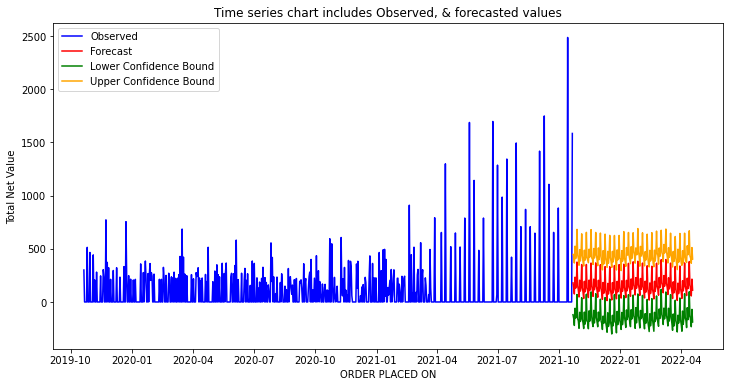

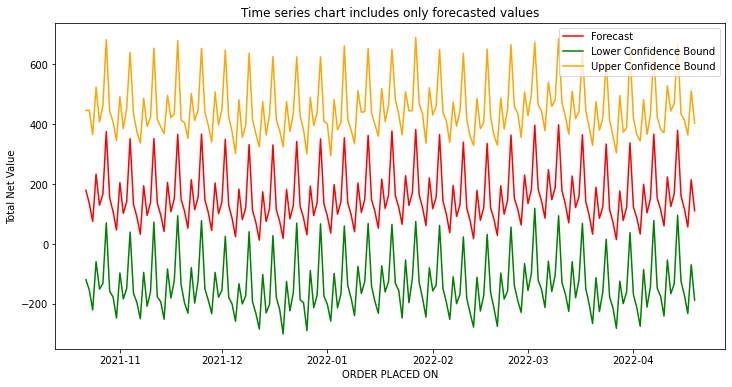

In [ ]:
forecast_next180days = plot_forecasts(df_tot2, n_days=180)

In [ ]:
forecast_next180days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-119.494,446.350
1,2021-10-23,136.019,-153.816,446.480
2,2021-10-24,75.032,-220.604,366.045
3,2021-10-25,233.108,-59.297,524.072
4,2021-10-26,129.316,-150.733,407.433
5,2021-10-27,167.054,-132.161,462.603
6,2021-10-28,375.344,70.083,682.448
7,2021-10-29,153.424,-158.061,442.799
8,2021-10-30,108.309,-177.238,407.702
9,2021-10-31,46.653,-247.528,345.168


### Forecast the Total net value of the clinic 827591 for next 210 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


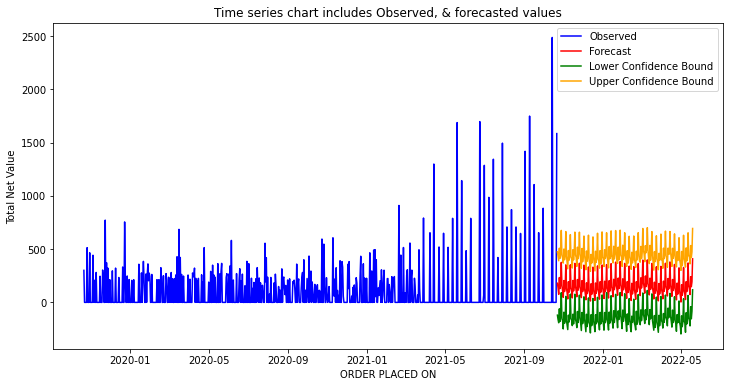

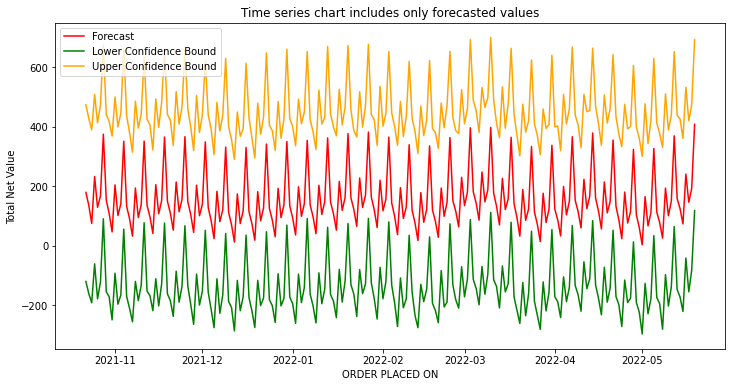

In [ ]:
forecast_next210days = plot_forecasts(df_tot2, n_days=210)

In [ ]:
forecast_next210days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-120.027,474.615
1,2021-10-23,136.019,-160.898,428.740
2,2021-10-24,75.032,-191.513,390.250
3,2021-10-25,233.108,-60.486,508.689
4,2021-10-26,129.316,-178.715,413.494
5,2021-10-27,167.054,-121.820,473.589
6,2021-10-28,375.344,90.782,675.490
7,2021-10-29,153.424,-154.550,441.561
8,2021-10-30,108.309,-171.888,417.896
9,2021-10-31,46.653,-249.151,368.934


### Forecast the Total net value of the clinic 827591 for next 240 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


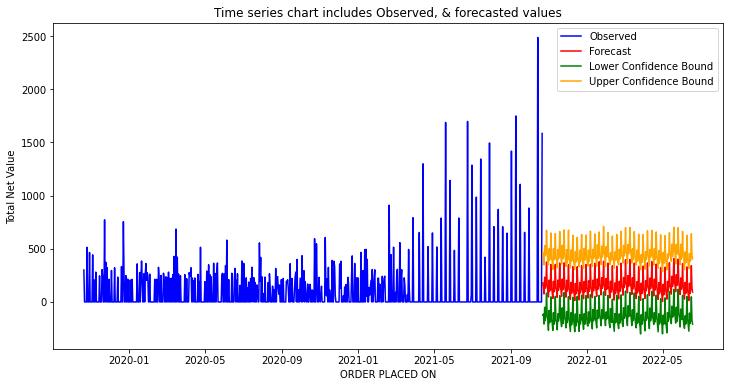

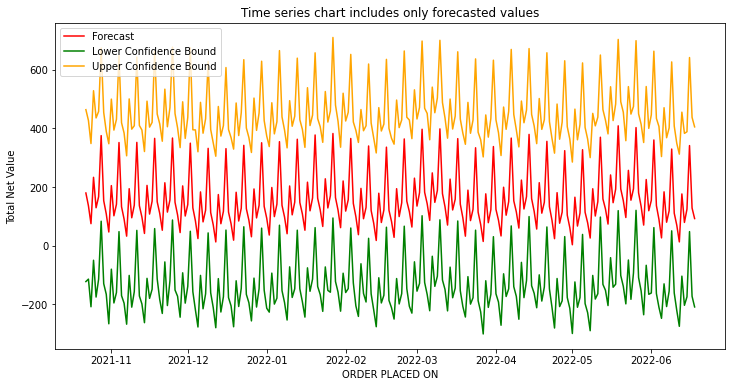

In [ ]:
forecast_next240days = plot_forecasts(df_tot2, n_days=240)

In [ ]:
forecast_next240days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-122.393,463.852
1,2021-10-23,136.019,-114.141,427.095
2,2021-10-24,75.032,-208.351,348.324
3,2021-10-25,233.108,-49.749,528.493
4,2021-10-26,129.316,-175.246,435.652
5,2021-10-27,167.054,-114.249,457.772
6,2021-10-28,375.344,83.408,674.005
7,2021-10-29,153.424,-129.622,454.124
8,2021-10-30,108.309,-165.821,389.684
9,2021-10-31,46.653,-266.439,347.608


### Forecast the Total net value of the clinic 827591 for next 270 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


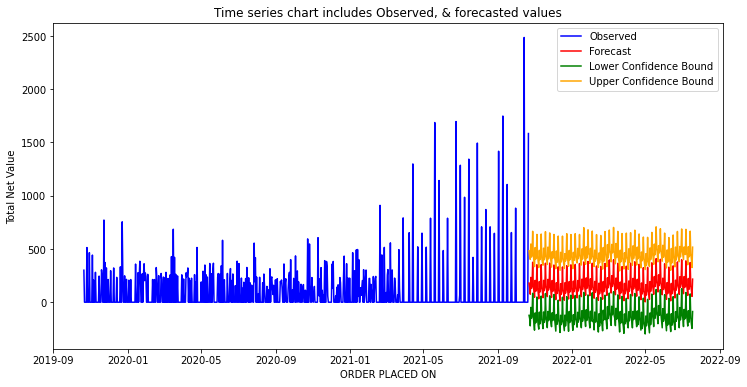

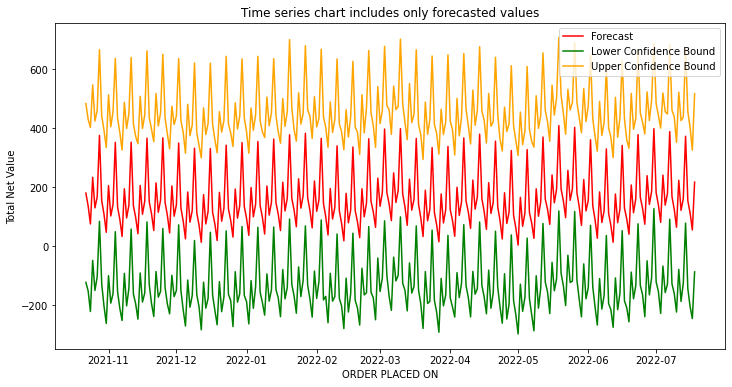

In [ ]:
forecast_next270days = plot_forecasts(df_tot2, n_days=270)

In [ ]:
forecast_next270days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-123.152,483.362
1,2021-10-23,136.019,-152.196,429.860
2,2021-10-24,75.032,-222.055,401.947
3,2021-10-25,233.108,-48.697,546.894
4,2021-10-26,129.316,-150.717,423.886
5,2021-10-27,167.054,-104.656,461.134
6,2021-10-28,375.344,83.725,666.033
7,2021-10-29,153.424,-129.186,441.811
8,2021-10-30,108.309,-203.640,392.871
9,2021-10-31,46.653,-262.629,334.550


### Forecast the Total net value of the clinic 827591 for next 300 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


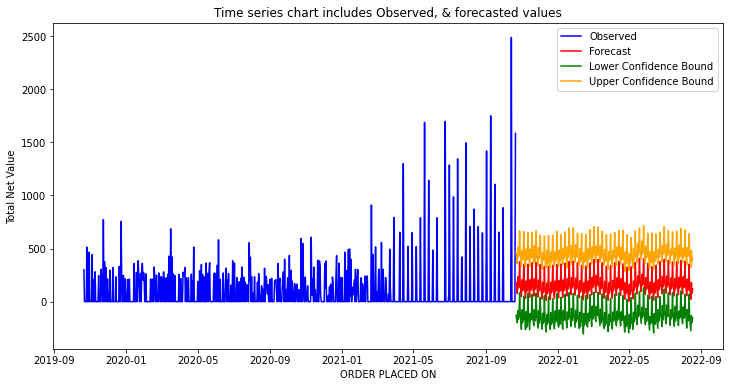

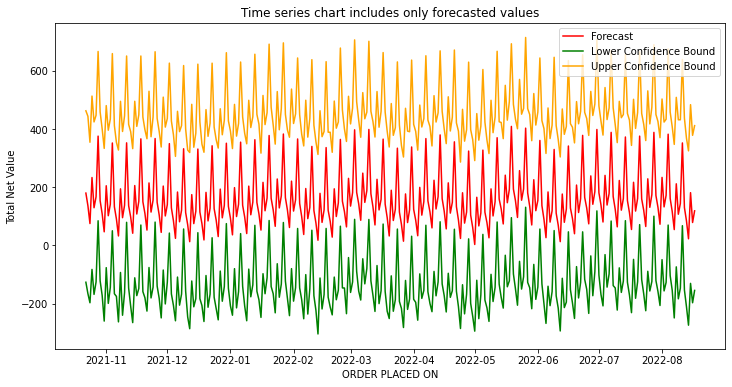

In [ ]:
forecast_next300days  = plot_forecasts(df_tot2, n_days=300)

In [ ]:
forecast_next300days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-126.548,462.306
1,2021-10-23,136.019,-165.939,443.409
2,2021-10-24,75.032,-197.030,354.319
3,2021-10-25,233.108,-82.512,512.913
4,2021-10-26,129.316,-168.302,424.146
5,2021-10-27,167.054,-125.625,447.184
6,2021-10-28,375.344,84.622,666.140
7,2021-10-29,153.424,-121.830,458.239
8,2021-10-30,108.309,-172.013,400.165
9,2021-10-31,46.653,-260.009,333.237


### Forecast the Total net value of the clinic 827591 for next 330 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


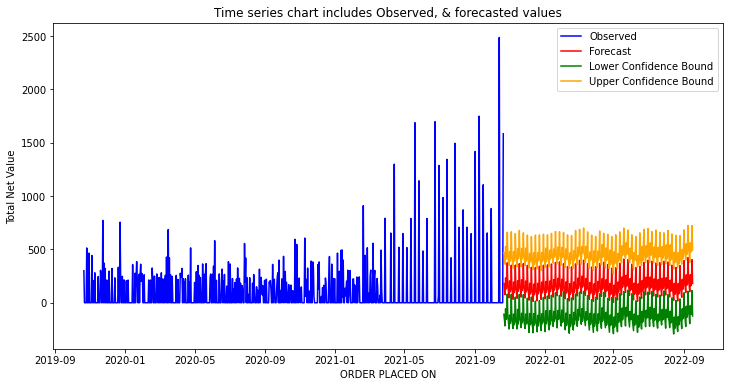

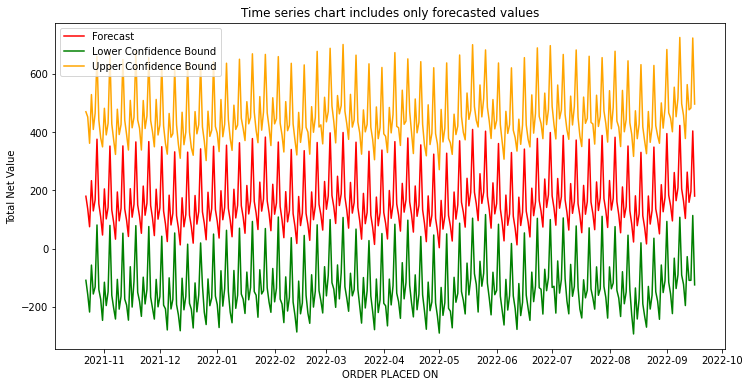

In [ ]:
forecast_next330days = plot_forecasts(df_tot2, n_days=330)

In [ ]:
forecast_next330days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-108.651,469.430
1,2021-10-23,136.019,-157.377,451.615
2,2021-10-24,75.032,-217.500,361.288
3,2021-10-25,233.108,-56.461,528.292
4,2021-10-26,129.316,-155.661,408.700
5,2021-10-27,167.054,-131.436,464.448
6,2021-10-28,375.344,81.087,660.280
7,2021-10-29,153.424,-140.325,441.043
8,2021-10-30,108.309,-173.654,379.808
9,2021-10-31,46.653,-246.071,348.973


### Forecast the Total net value of the clinic 827591 for next 365 days

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


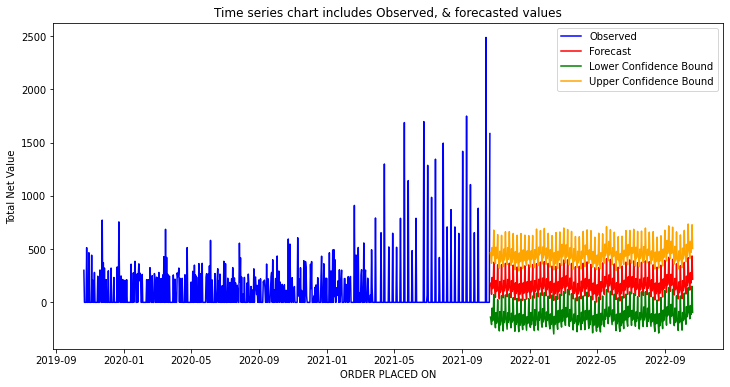

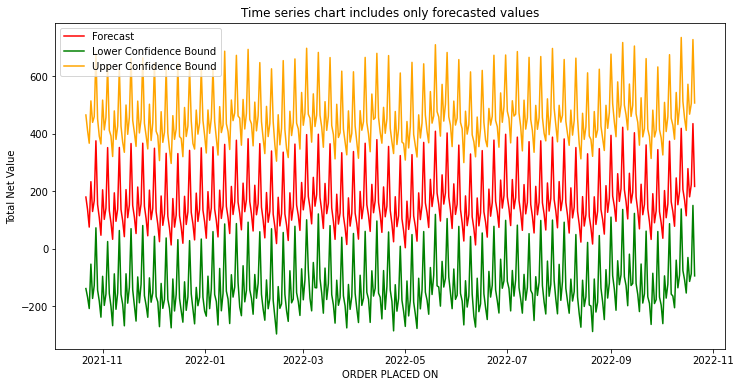

In [ ]:
forecast_next365days = plot_forecasts(df_tot2, n_days=365)

In [ ]:
forecast_next365days[['ds','yhat','yhat_lower','yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2021-10-22,179.655,-138.989,465.312
1,2021-10-23,136.019,-168.860,411.362
2,2021-10-24,75.032,-208.495,366.987
3,2021-10-25,233.108,-53.946,514.410
4,2021-10-26,129.316,-173.426,439.635
5,2021-10-27,167.054,-128.124,459.499
6,2021-10-28,375.344,72.450,678.053
7,2021-10-29,153.424,-144.055,451.993
8,2021-10-30,108.309,-182.326,391.824
9,2021-10-31,46.653,-238.578,364.368
